# 라이브러리

In [56]:
import json, os, random, shutil, platform, yaml
from collections import Counter, defaultdict

import cv2, numpy as np, pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image, ImageDraw, ImageFont

import torch, torchvision
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from torchvision.transforms.functional import to_pil_image
import albumentations as A
from albumentations.pytorch import ToTensorV2

# 재현성

In [57]:
# 재현성
def set_seed(seed=42):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True  # 이미지엔 대체로 이게 빠름

set_seed()

In [58]:
# 디바이스 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device: ", device)

device:  cuda


In [59]:
"""

일단 베이스 EDA 코드에서 작업을 진행하였습니다.
좀더 디테일한 EDA와 전처리 작업을 위해 내용 추가를 주로 진행하였으니
참고하시고 작업 이어가시기 바랍니다.
"""

'\n\n일단 베이스 EDA 코드에서 작업을 진행하였습니다.\n좀더 디테일한 EDA와 전처리 작업을 위해 내용 추가를 주로 진행하였으니\n참고하시고 작업 이어가시기 바랍니다.\n'

# 데이터 불러오기

In [60]:
!kaggle competitions download -c ai04-level1-project -p ./data

ai04-level1-project.zip: Skipping, found more recently modified local copy (use --force to force download)


In [61]:
# Windows 호환: 폴더 생성 + 압축 해제
import os, zipfile
from pathlib import Path

data_root = Path('./data')
data_root.mkdir(parents=True, exist_ok=True)

# 가장 최근 ai04-level1-project*.zip 찾기
cands = sorted(list(data_root.glob('ai04-level1-project*.zip')) + list(Path('.').glob('ai04-level1-project*.zip')))
if not cands:
    print('경고: ai04-level1-project*.zip을 찾지 못했습니다. 먼저 다운로드 셀을 실행하세요.')
else:
    zip_path = cands[-1]
    with zipfile.ZipFile(zip_path, 'r') as z:
        z.extractall(data_root)
    print(f'압축 해제: {zip_path} -> {data_root}')

압축 해제: data\ai04-level1-project.zip -> data


In [62]:
# 경로설정 (자동 보정 포함)
import os
from pathlib import Path

data_root = Path('./data')
# 기본 가정
base_dir = data_root
# 일반적으로 압축이 폴더로 풀리는 경우 보정
cand = data_root / 'ai04-level1-project'
if cand.exists():
    base_dir = cand

# train/test/annotations 폴더 확인 후 최종 결정
for root, dirs, files in os.walk(base_dir):
    if {'train_images','test_images','train_annotations'}.issubset(set(dirs)):
        base_dir = Path(root)
        break

data_dir = str(base_dir)
annotations_dir = os.path.join(data_dir, 'train_annotations')
train_dir = os.path.join(data_dir, 'train_images')
test_dir = os.path.join(data_dir, 'test_images')

print('data_dir:', data_dir)
print('exists:', os.path.exists(train_dir), os.path.exists(test_dir), os.path.exists(annotations_dir))

# 이미지 파일 목록
train_images = [f for f in os.listdir(train_dir) if f.lower().endswith(('.png','.jpg','.jpeg'))]
print('이미지 개수:', len(train_images))
print('샘플 3개:', train_images[:3])

# 어노테이션 파일 목록
json_files = []
for root, dirs, files in os.walk(annotations_dir):
    for file in files:
        if file.lower().endswith('.json'):
            json_files.append(os.path.join(root, file))
print('어노테이션 파일 개수:', len(json_files))
print('샘플 3개:', json_files[:3])

# json 하나 열어서 구조 확인
if json_files:
    import json, pandas as pd
    with open(json_files[0], 'r', encoding='utf-8') as f:
        data = json.load(f)
    print('keys:', data.keys())
    print('이미지 수:', len(data.get('images', [])))
    print('어노테이션 수:', len(data.get('annotations', [])))
    print('카테고리 수:', len(data.get('categories', [])))
    categories = pd.DataFrame(data.get('categories', []))
    print('유니크 클래스 개수:', categories.shape[0])
    print('클래스 이름 예시:', categories.head())
else:
    print('경고: JSON 어노테이션을 찾지 못했습니다.')

data_dir: data
exists: True True True
이미지 개수: 1489
샘플 3개: ['K-001900-010224-016551-031705_0_2_0_2_70_000_200.png', 'K-001900-010224-016551-031705_0_2_0_2_75_000_200.png', 'K-001900-010224-016551-031705_0_2_0_2_90_000_200.png']
어노테이션 파일 개수: 4526
샘플 3개: ['data\\train_annotations\\K-001900-010224-016551-031705_json\\K-001900\\K-001900-010224-016551-031705_0_2_0_2_70_000_200.json', 'data\\train_annotations\\K-001900-010224-016551-031705_json\\K-001900\\K-001900-010224-016551-031705_0_2_0_2_75_000_200.json', 'data\\train_annotations\\K-001900-010224-016551-031705_json\\K-001900\\K-001900-010224-016551-031705_0_2_0_2_90_000_200.json']
keys: dict_keys(['images', 'type', 'annotations', 'categories'])
이미지 수: 1
어노테이션 수: 1
카테고리 수: 1
유니크 클래스 개수: 1
클래스 이름 예시:   supercategory    id        name
0          pill  1899  보령부스파정 5mg


In [63]:
"""
데이터 불러오는 코드를 다시 작성하였습니다.

"""

'\n데이터 불러오는 코드를 다시 작성하였습니다.\n\n'

## 클래스 갯수 및 bbox 평균

In [64]:
all_classes = []
all_boxes = []

for jf in json_files:
    with open(jf, 'r', encoding='utf-8') as f:
        data = json.load(f)

    # 카테고리 정보
    for cat in data['categories']:
        all_classes.append(cat['name'])

    # 바운딩 박스 정보
    for ann in data['annotations']:
        if 'bbox' in ann and len(ann['bbox']) == 4:
            all_boxes.append(ann['bbox'])


# 클래스 분포
unique_classes = list(set(all_classes))
cls_counter = Counter(all_classes)

print('상위 10개 클래스:', cls_counter.most_common(10))

# 바운딩 박스 크기 분포
widths = [b[2] for b in all_boxes]
heights = [b[3] for b in all_boxes]
print('bbox 평균 크기:', np.mean(widths), np.mean(heights))

상위 10개 클래스: [('기넥신에프정(은행엽엑스)(수출용)', 514), ('일양하이트린정 2mg', 240), ('보령부스파정 5mg', 180), ('뮤테란캡슐 100mg', 172), ('가바토파정 100mg', 143), ('동아가바펜틴정 800mg', 139), ('아토젯정 10/40mg', 113), ('리바로정 4mg', 111), ('리피토정 20mg', 109), ('크레스토정 20mg', 108)]
bbox 평균 크기: 259.326557666814 288.7459125055236


In [65]:
# VS Code/Windows 한글 폰트 설정 (리눅스 전용 명령 제거)
import os, warnings
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
warnings.filterwarnings(action='ignore')


def setup_korean_font():
    # 후보 폰트 파일(Windows 기본)
    candidates = [
        r"C:\\Windows\\Fonts\\malgun.ttf",      # 맑은 고딕
        r"C:\\Windows\\Fonts\\malgunbd.ttf",    # 맑은 고딕 Bold
        r"C:\\Windows\\Fonts\\batang.ttc",      # 바탕
        r"C:\\Windows\\Fonts\\gulim.ttc",       # 굴림
        r"C:\\Windows\\Fonts\\arial.ttf",       # 대체 영문
    ]
    for p in candidates:
        if os.path.exists(p):
            try:
                fm.fontManager.addfont(p)
            except Exception:
                pass

    # 등록된 폰트 중 선호 순서로 선택
    available = {f.name for f in fm.fontManager.ttflist}
    prefer = ["Malgun Gothic", "맑은 고딕", "Batang", "Gulim", "Arial"]
    chosen = None
    for name in prefer:
        if name in available:
            chosen = name
            break
    if chosen is None:
        # 대체: 현재 기본값 유지
        chosen = plt.rcParams.get('font.family', ['sans-serif'])
        if isinstance(chosen, list) and chosen:
            chosen = chosen[0]
        elif not chosen:
            chosen = 'sans-serif'

    plt.rc('font', family=chosen)
    plt.rcParams['axes.unicode_minus'] = False
    print('Matplotlib font set to:', chosen)


setup_korean_font()

Matplotlib font set to: Malgun Gothic


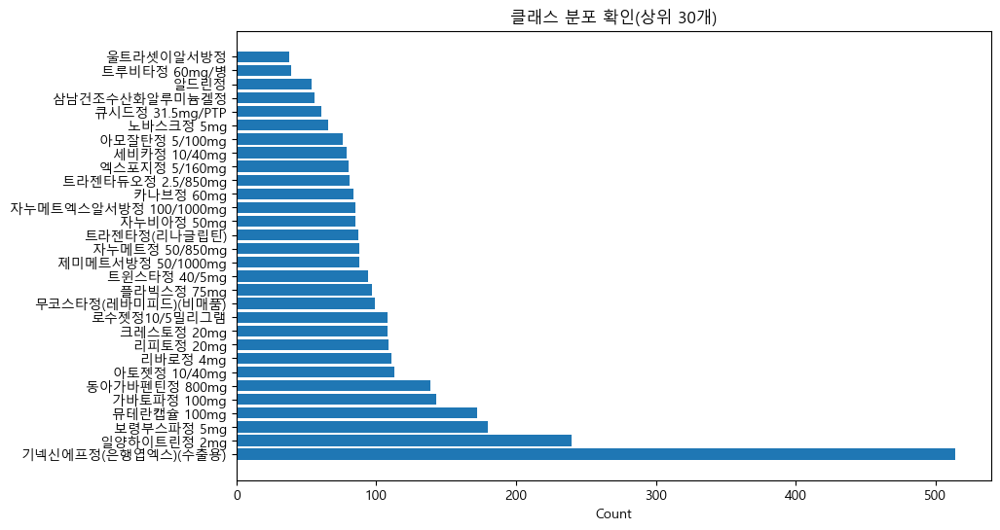

In [66]:
# 클래스 분포 확인(상위 30개)
top_classes = cls_counter.most_common(30)
names, counts = zip(*top_classes)

plt.figure(figsize=(10,6))
plt.barh(names, counts)
plt.xlabel('Count')
plt.title('클래스 분포 확인(상위 30개)')
plt.show()

## Unique Size 확인

In [67]:
sizes = []
for f in os.listdir(train_dir):
    if f.endswith('.png'):
        path = os.path.join(train_dir, f)
        with Image.open(path) as img:
            sizes.append(img.size)  # (width, height)

# 유니크한 사이즈 종류
unique_sizes = Counter(sizes)

print('총 이미지 개수:', len(sizes))
print('유니크 사이즈 개수:', len(unique_sizes))
print('상위 10개 사이즈:', unique_sizes.most_common(10))

총 이미지 개수: 1489
유니크 사이즈 개수: 1
상위 10개 사이즈: [((976, 1280), 1489)]


## bbox 시각화

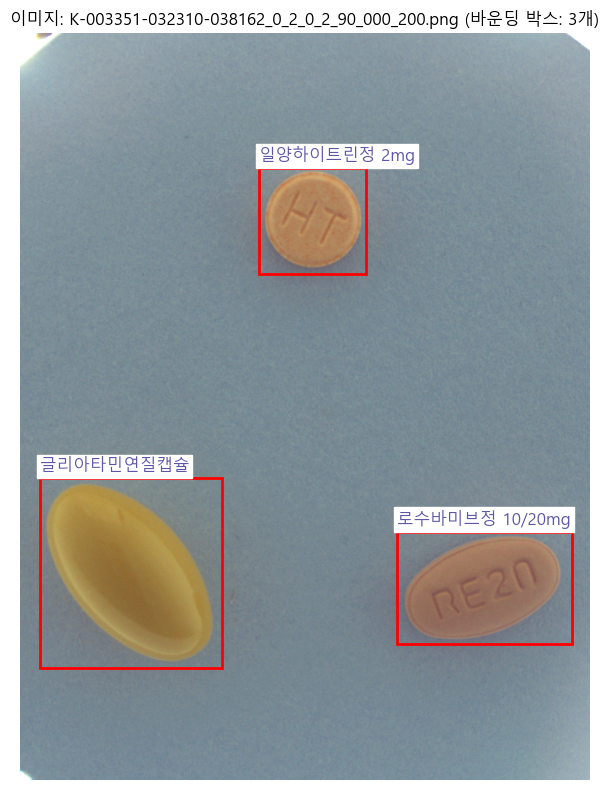

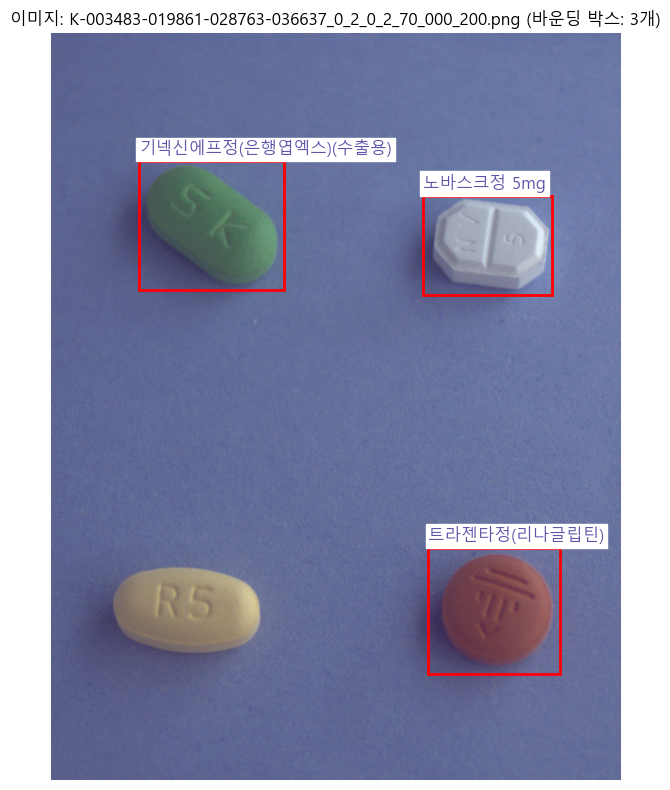

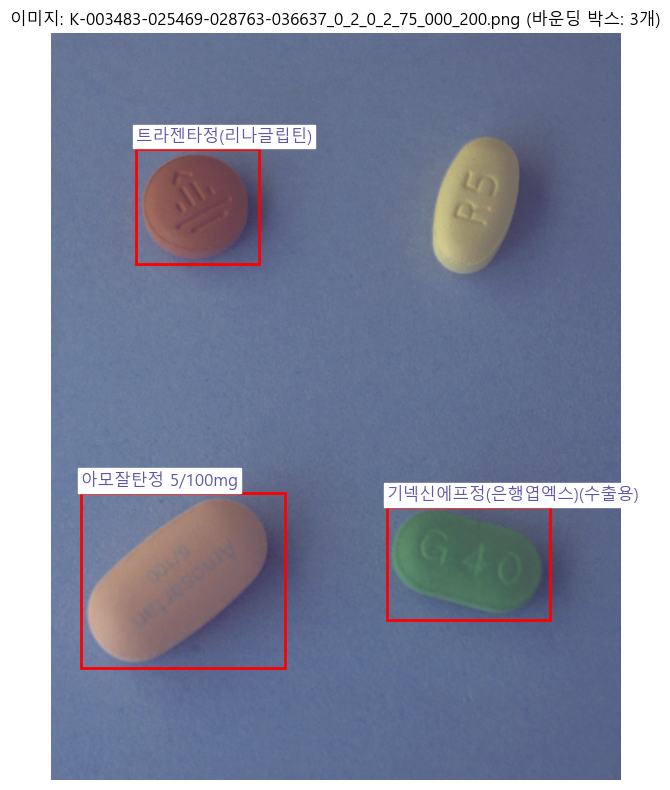

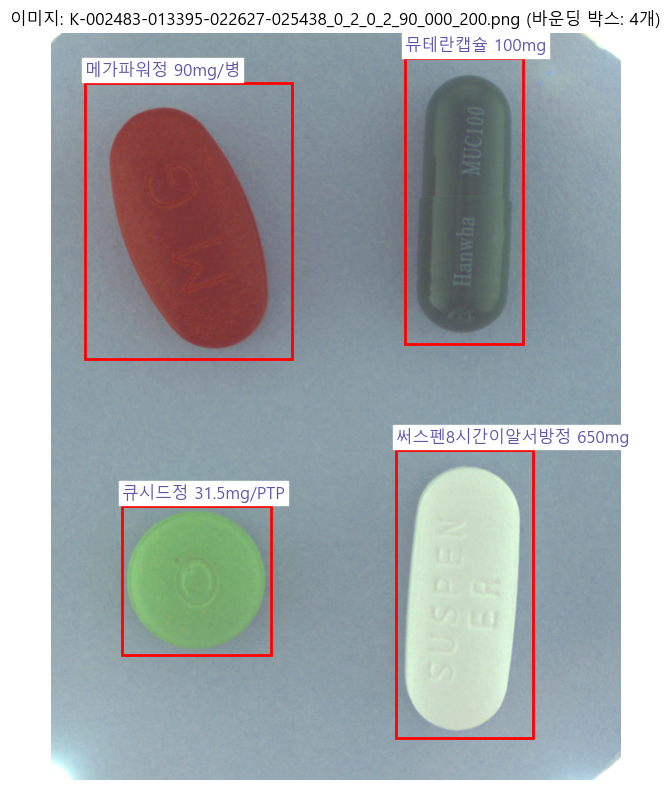

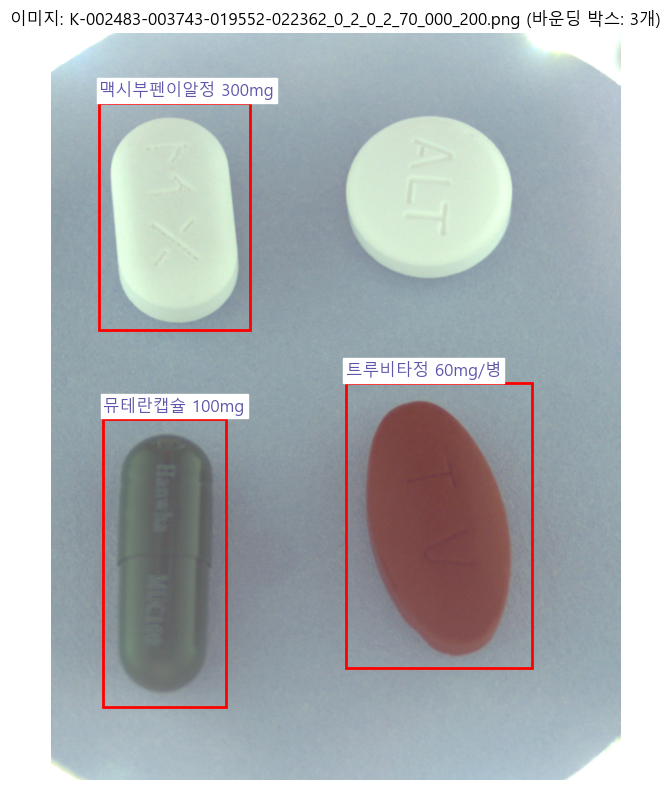

In [68]:
def visualize_pill_dataset(data_dir, json_files, num_samples=5):
    """
    json 파일로 바운딩 박스를 시각화하는 함수

    Args:
        data_dir: 이미지 파일이 있는 디렉토리 경로
        json_files: JSON 파일 경로 리스트
        num_samples: 시각화할 샘플 수 
    """

    annotations = defaultdict(list)

    # 각 JSON 파일 처리 -> dict에 [img file_name]을 key로 {어노테이션정보: [바운드박스]}뽑아서 리스트로 저장하기
    for json_path in json_files:
        with open(json_path, 'r', encoding='utf-8') as f:
            data = json.load(f)

            file_name = data['images'][0]['file_name']
            bbox = data['annotations'][0]['bbox']
            category_name = data['categories'][0]['name']

            annotations[file_name].append({category_name: bbox})

    items_list = list(annotations.items())
    random.shuffle(items_list)

    # 시각화
    for file_name, anno in items_list[:num_samples]:
        image_path = os.path.join(data_dir, file_name)
        img = Image.open(image_path).convert("RGB")

        fig, ax = plt.subplots(1, figsize=(8, 8))
        ax.imshow(img)

        # 모든 바운딩 박스 그리기
        for a in anno:

            label = list(a.keys())[0]
            bbox = list(a.values())[0]

            x, y, width, height = bbox

            # 바운딩 박스 그리기
            rect = patches.Rectangle(
                (x, y), width, height,
                linewidth=2, edgecolor='r', facecolor='none'
            )
            ax.add_patch(rect)

            # 라벨 텍스트
            ax.text(
                x, y - 12, label,
                fontsize=12, color='#5e57a9',
                bbox=dict(facecolor='white', alpha=1, pad=2, edgecolor='White')
            )

        ax.axis('off')
        plt.title(f"이미지: {file_name} (바운딩 박스: {len(anno)}개)")
        plt.tight_layout()
        plt.show()


visualize_pill_dataset(train_dir, json_files, num_samples=5)

## YOLO용 Dataset 구성

In [69]:
# 새 YOLO용 경로
yolo_root = os.path.join(data_dir, 'data_yolo')
img_train_dir = os.path.join(yolo_root, 'images/train')
img_val_dir = os.path.join(yolo_root, 'images/val')

label_root = os.path.join(yolo_root, 'labels')
lbl_train_dir = os.path.join(label_root, 'train')


In [70]:
lbl_val_dir = os.path.join(label_root, 'val')

for d in [img_train_dir, img_val_dir, lbl_train_dir, lbl_val_dir]:
    os.makedirs(d, exist_ok=True)

In [71]:
# 전역 class_map (name → id)
class_map = {}
class_counter = 0
for jf in json_files:
    with open(jf, 'r', encoding='utf-8') as f:
        data = json.load(f)
    for cat in data.get('categories', []):
        name = cat['name']
        if name not in class_map:
            class_map[name] = class_counter
            class_counter += 1

sorted_keys = sorted(class_map.keys())
class_map = {key: idx for idx, key in enumerate(sorted_keys)}

print('클래스 개수:', len(class_map))

클래스 개수: 73


In [72]:
# 이미지별 json 묶기
img2json = defaultdict(list)
for jf in json_files:
    with open(jf, 'r', encoding='utf-8') as f:
        data = json.load(f)
    img_name = data['images'][0]['file_name']
    img2json[img_name].append(jf)
print('총 이미지 개수:', len(img2json))

총 이미지 개수: 1489


In [73]:
def convert_jsons_to_txt(json_list, save_dir, class_map):
    '''
    YOLO txt 변환 함수
    '''
    if not json_list: return None
    with open(json_list[0], 'r', encoding='utf-8') as f:
        first_data = json.load(f)
    img = first_data['images'][0]
    img_w, img_h = img['width'], img['height']
    img_name = img['file_name']
    label_path = os.path.join(save_dir, img_name.replace('.png', '.txt'))

    yolo_lines = []
    for jf in json_list:
        with open(jf, 'r', encoding='utf-8') as f:
            data = json.load(f)
        id2name = {cat['id']: cat['name'] for cat in data['categories']}
        for ann in data['annotations']:
            if 'bbox' not in ann or len(ann['bbox']) != 4:
                continue
            x, y, w, h = ann['bbox']
            x_center = (x + w / 2) / img_w
            y_center = (y + h / 2) / img_h
            w /= img_w
            h /= img_h

            cat_id = ann['category_id']
            if cat_id not in id2name:
                continue
            name = id2name[cat_id]
            if name not in class_map:
                continue
            cls_id = class_map[name]

            yolo_lines.append(f'{cls_id} {x_center} {y_center} {w} {h}')

    if yolo_lines:
        with open(label_path, 'w', encoding='utf-8') as f:
            f.write('\n'.join(yolo_lines) + '\n')
    return img_name

In [74]:
# 학습/검증 데이터 분할
images = list(img2json.keys())
random.shuffle(images)
split_idx = int(len(images) * 0.8)
train_imgs, val_imgs = images[:split_idx], images[split_idx:]

print('Train 이미지:', len(train_imgs))
print('Val 이미지:', len(val_imgs))

Train 이미지: 1191
Val 이미지: 298


In [75]:
# 변환 및 심볼릭 링크 생성
def symlink(src, dst):
    system = platform.system()

    try:
        if system == 'Windows':
            import subprocess
            subprocess.call(['mklink', '/D', dst, src], shell=True)
        else:  # Unix, Linux, MacOS
            import os
            os.symlink(src, dst)

    except Exception as e:
        print(f"심볼릭 링크 생성 중 오류 발생: {e}")


# train set
for img_name in train_imgs:
    img_src = os.path.join(train_dir, img_name)
    img_dst = os.path.join(img_train_dir, img_name)
    if not os.path.exists(img_dst):
        try:
            symlink(img_src, img_dst)
        except:
            shutil.copy(img_src, img_dst)  # fallback
    convert_jsons_to_txt(img2json[img_name], lbl_train_dir, class_map)

# val set
for img_name in val_imgs:
    img_src = os.path.join(train_dir, img_name)
    img_dst = os.path.join(img_val_dir, img_name)
    if not os.path.exists(img_dst):
        try:
            symlink(img_src, img_dst)
        except:
            shutil.copy(img_src, img_dst)  # fallback
    convert_jsons_to_txt(img2json[img_name], lbl_val_dir, class_map)


print('YOLO data_yolo 준비 완료')
print('data_yolo/images/train:', len(os.listdir(img_train_dir)))
print('data_yolo/labels/train:', len(os.listdir(lbl_train_dir)))
print('data_yolo/images/val:', len(os.listdir(img_val_dir)))
print('data_yolo/labels/val:', len(os.listdir(lbl_val_dir)))

YOLO data_yolo 준비 완료
data_yolo/images/train: 1341
data_yolo/labels/train: 1488
data_yolo/images/val: 148
data_yolo/labels/val: 990


In [76]:
class_ids = set()

for split in ['train', 'val']:
    split_dir = os.path.join(label_root, split)
    for f in os.listdir(split_dir):
        if f.endswith('.txt'):
            with open(os.path.join(split_dir, f), 'r', encoding='utf-8') as ftxt:
                for line in ftxt:
                    cls_id = int(line.split()[0])
                    class_ids.add(cls_id)

print('클래스 개수:', len(class_ids))
print('클래스 ID 목록:', sorted(class_ids))

클래스 개수: 73
클래스 ID 목록: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]


In [77]:
# YOLO 데이터셋용 YAML 저장 (권장 포맷)
# path: yolo_root, train/val: 상대 경로로 지정
import os

yaml_path = os.path.join(yolo_root, 'yolo_data.yaml')

# class_map: {name -> id} 이므로, id 순으로 names 리스트를 정렬해 생성
names_list = [name for name, _id in sorted(class_map.items(), key=lambda kv: kv[1])]

data_yaml = {
    'path': yolo_root,           # 데이터셋 루트
    'train': 'images/train',     # 상대 경로 권장
    'val': 'images/val',         # 상대 경로 권장
    'nc': len(names_list),
    'names': names_list,
}

with open(yaml_path, 'w', encoding='utf-8') as f:
    yaml.dump(data_yaml, f, allow_unicode=True, sort_keys=False)

print(f"yaml 저장 완료 → {yaml_path}")

yaml 저장 완료 → data\data_yolo\yolo_data.yaml


In [78]:
"""
일단 코드가 기존 EDA 코드랑 많이 달라졌습니다. 

팀원분들 것을 참고한 것도 있고, 제가 수정한 부분도 있습니다.

이 점 참고해주시면 감사하겠습니다.
"""

'\n일단 코드가 기존 EDA 코드랑 많이 달라졌습니다. \n\n팀원분들 것을 참고한 것도 있고, 제가 수정한 부분도 있습니다.\n\n이 점 참고해주시면 감사하겠습니다.\n'

## 겹치는 bbox

In [79]:
# 삭제할 클래스 ID가 있는 파일과 클래스 정보 딕셔너리
files_to_fix = {
    'K-001900-016548-019607-033009_0_2_0_2_70_000_200.txt': {0},
    'K-003351-018147-020238_0_2_0_2_90_000_200.txt': {72},
    'K-003351-003832-029667_0_2_0_2_90_000_200.txt': {7},
    'K-003351-029667-031863_0_2_0_2_70_000_200.txt': {49},
    'K-003351-020238-031863_0_2_0_2_70_000_200.txt': {72},
}

for filename, classes_to_remove in files_to_fix.items():
    path = os.path.join(lbl_train_dir, filename)

    if not os.path.exists(path):
        print(f"파일이 존재하지 않습니다: {filename}")
        continue

    with open(path, 'r') as f:
        lines = f.readlines()

    # 삭제할 클래스 ID를 가진 라인 제외
    filtered_lines = [line for line in lines if int(line.strip().split()[0]) not in classes_to_remove]

    # 수정된 내용으로 파일 덮어쓰기
    with open(path, 'w') as f:
        f.writelines(filtered_lines)

    print(f"완료: {filename} 에서 클래스 {classes_to_remove} 라인 삭제함")

완료: K-001900-016548-019607-033009_0_2_0_2_70_000_200.txt 에서 클래스 {0} 라인 삭제함
완료: K-003351-018147-020238_0_2_0_2_90_000_200.txt 에서 클래스 {72} 라인 삭제함
완료: K-003351-003832-029667_0_2_0_2_90_000_200.txt 에서 클래스 {7} 라인 삭제함
완료: K-003351-029667-031863_0_2_0_2_70_000_200.txt 에서 클래스 {49} 라인 삭제함
완료: K-003351-020238-031863_0_2_0_2_70_000_200.txt 에서 클래스 {72} 라인 삭제함


## 대응되지 않는 어노테이션 찾아보기

In [ ]:
# 대응 어노테이션(원본 JSON/YOLO 라벨) 누락 이미지 탐지 + 리포트 저장
from pathlib import Path
from collections import defaultdict
import os, json

results_dir = Path("results"); results_dir.mkdir(exist_ok=True)

def get_img_name_from_json(data):
    # 다양한 스키마 방어
    img_name = None
    if isinstance(data.get("images"), list) and data["images"]:
        img_name = data["images"][0].get("file_name")
    if not img_name and isinstance(data.get("image"), dict):
        img_name = data["image"].get("file_name") or data["image"].get("name") or data["image"].get("file")
    return img_name

# 이미지 → JSON 매핑 구성
img2json_miss = defaultdict(list)
for jf in json_files:
    try:
        with open(jf, 'r', encoding='utf-8') as f:
            data = json.load(f)
    except Exception as e:
        print(f"JSON 로드 실패: {jf} :: {e}")
        continue
    img_name = get_img_name_from_json(data)
    if not img_name:
        continue
    img2json_miss[img_name].append(jf)

# 원본 학습 이미지 집합
train_imgs_set = {f for f in os.listdir(train_dir) if f.lower().endswith(('.png','.jpg','.jpeg'))}

# JSON 자체가 없는 이미지
no_json = sorted([img for img in train_imgs_set if img not in img2json_miss])

# JSON은 있으나 유효 bbox(길이4, 면적>0)가 전혀 없는 이미지
no_valid_bbox = []
details = []
for img in train_imgs_set:
    jfs = img2json_miss.get(img, [])
    if not jfs:
        continue
    valid_cnt = 0
    for jf in jfs:
        try:
            with open(jf, 'r', encoding='utf-8') as f:
                data = json.load(f)
        except:
            continue
        anns = data.get('annotations', [])
        for ann in anns:
            bbox = ann.get('bbox')
            if bbox and len(bbox) == 4:
                _, _, w, h = bbox
                if (w is not None) and (h is not None) and (w > 0) and (h > 0):
                    valid_cnt += 1
    if valid_cnt == 0:
        no_valid_bbox.append(img)
        details.append((img, ";".join(jfs)))

# YOLO 라벨 기준 누락(복제된 세트 기준)
def yolo_missing_list(images_dir, labels_dir):
    miss, empty = [], []
    if not os.path.exists(images_dir):
        return miss, empty
    for img in os.listdir(images_dir):
        if not img.lower().endswith(('.png','.jpg','.jpeg')): 
            continue
        base = os.path.splitext(img)[0]
        lbl_path = os.path.join(labels_dir, base + ".txt")
        if not os.path.exists(lbl_path):
            miss.append(img)
        else:
            try:
                with open(lbl_path, 'r', encoding='utf-8') as f:
                    lines = [ln.strip() for ln in f if ln.strip()]
                if len(lines) == 0:
                    empty.append(img)
            except:
                empty.append(img)
    return sorted(miss), sorted(empty)

yolo_miss_train, yolo_empty_train = yolo_missing_list(img_train_dir, lbl_train_dir)
yolo_miss_val,   yolo_empty_val   = yolo_missing_list(img_val_dir,   lbl_val_dir)

# 리포트 출력
print("=== 원본 JSON 기준 누락 요약 ===")
print(f"- JSON 파일 자체 없음: {len(no_json)}개")
print(f"- JSON은 있으나 유효 bbox 없음: {len(no_valid_bbox)}개")

print("\n=== YOLO 라벨 기준 누락 요약 ===")
print(f"- train 이미지 대비 라벨 파일 없음: {len(yolo_miss_train)}개")
print(f"- train 라벨 파일은 있으나 비어있음: {len(yolo_empty_train)}개")
print(f"- val   이미지 대비 라벨 파일 없음: {len(yolo_miss_val)}개")
print(f"- val   라벨 파일은 있으나 비어있음: {len(yolo_empty_val)}개")


# 샘플 출력(각 5개)
print("\n샘플 미리보기:")
print("- JSON 없음:", no_json[:5])
print("- 유효 bbox 없음:", no_valid_bbox[:5])
print("- YOLO 라벨 없음(train):", yolo_miss_train[:5])
print("- YOLO 라벨 비어있음(train):", yolo_empty_train[:5])

=== 원본 JSON 기준 누락 요약 ===
- JSON 파일 자체 없음: 0개
- JSON은 있으나 유효 bbox 없음: 0개

=== YOLO 라벨 기준 누락 요약 ===
- train 이미지 대비 라벨 파일 없음: 1개
- train 라벨 파일은 있으나 비어있음: 0개
- val   이미지 대비 라벨 파일 없음: 53개
- val   라벨 파일은 있으나 비어있음: 0개

샘플 미리보기:
- JSON 없음: []
- 유효 bbox 없음: []
- YOLO 라벨 없음(train): ['K-003351-019232-021325_0_2_0_2_90_000_200.png']
- YOLO 라벨 비어있음(train): []


In [81]:
# 문제 이미지
target = "K-003351-019232-021325_0_2_0_2_90_000_200.png"
base = os.path.splitext(target)[0]

print("이미지 존재(images/train):", os.path.exists(os.path.join(img_train_dir, target)))
print("라벨 존재(labels/train):", os.path.exists(os.path.join(lbl_train_dir, base + ".txt")))

# 혹시 다른 이름으로 라벨이 만들어졌는지 검사
import glob
print("유사 라벨:", glob.glob(os.path.join(lbl_train_dir, base + "*.txt")))

# 변환 이유 점검
jfs = img2json.get(target, [])
print("매핑된 JSON 개수:", len(jfs))
from collections import Counter
ok, reasons = 0, []
if jfs:
    with open(jfs[0], "r", encoding="utf-8") as f:
        first = json.load(f)
    img_w, img_h = first["images"][0]["width"], first["images"][0]["height"]
    for jf in jfs:
        with open(jf, "r", encoding="utf-8") as f:
            d = json.load(f)
        id2name = {c["id"]: c["name"] for c in d.get("categories", [])}
        for ann in d.get("annotations", []):
            bbox = ann.get("bbox")
            if not bbox or len(bbox) != 4:
                reasons.append("bbox형식불량"); continue
            x,y,w,h = bbox
            if w is None or h is None or w <= 0 or h <= 0:
                reasons.append("면적0"); continue
            name = id2name.get(ann.get("category_id"))
            if name is None:
                reasons.append("카테고리불일치"); continue
            if name not in class_map:
                reasons.append("class_map미포함"); continue
            ok += 1
    print("유효 라벨 수:", ok)
    if ok == 0:
        print("필터 사유 분포:", Counter(reasons))

이미지 존재(images/train): True
라벨 존재(labels/train): False
유사 라벨: []
매핑된 JSON 개수: 3
유효 라벨 수: 3


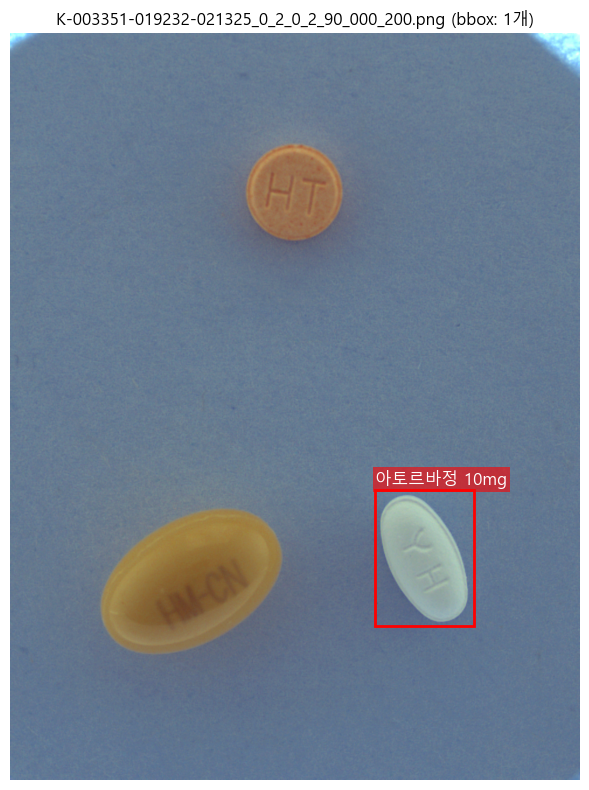

In [82]:
import os, json
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# 시각화할 JSON 경로
json_path = r"c:\Users\user\.vscode\pill-snap\notebooks\data\train_annotations\K-003351-019232-021325_json\K-021325\K-003351-019232-021325_0_2_0_2_90_000_200.json"

with open(json_path, "r", encoding="utf-8") as f:
    data = json.load(f)

# 이미지 경로
file_name = data["images"][0]["file_name"]
img_path = os.path.join(train_dir, file_name)  # train_dir는 위에서 이미 정의됨

# 카테고리 맵
id2name = {c["id"]: c["name"] for c in data.get("categories", [])}

# 이미지 열기
assert os.path.exists(img_path), f"이미지 없음: {img_path}"
img = Image.open(img_path).convert("RGB")

# 시각화
fig, ax = plt.subplots(1, figsize=(8, 8))
ax.imshow(img)

anns = data.get("annotations", [])
for ann in anns:
    bbox = ann.get("bbox")
    if not bbox or len(bbox) != 4:
        continue
    x, y, w, h = bbox
    rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor="r", facecolor="none")
    ax.add_patch(rect)
    name = id2name.get(ann.get("category_id"), "unknown")
    ax.text(x, max(y-8, 0), name, fontsize=12, color="white",
            bbox=dict(facecolor="red", alpha=0.6, pad=2, edgecolor="none"))

ax.axis("off")
plt.title(f"{file_name} (bbox: {len(anns)}개)")
plt.tight_layout()
plt.show()

In [88]:
# 문제 이미지
target = "K-003351-019232-021325_0_2_0_2_90_000_200.png"
base = os.path.splitext(target)[0]

print("이미지 존재(images/train):", os.path.exists(os.path.join(img_train_dir, target)))
print("라벨 존재(labels/train):", os.path.exists(os.path.join(lbl_train_dir, base + ".txt")))

# 혹시 다른 이름으로 라벨이 만들어졌는지 검사
import glob
print("유사 라벨:", glob.glob(os.path.join(lbl_train_dir, base + "*.txt")))

# 변환 이유 점검
jfs = img2json.get(target, [])
print("매핑된 JSON 개수:", len(jfs))
from collections import Counter
ok, reasons = 0, []
if jfs:
    with open(jfs[0], "r", encoding="utf-8") as f:
        first = json.load(f)
    img_w, img_h = first["images"][0]["width"], first["images"][0]["height"]
    for jf in jfs:
        with open(jf, "r", encoding="utf-8") as f:
            d = json.load(f)
        id2name = {c["id"]: c["name"] for c in d.get("categories", [])}
        for ann in d.get("annotations", []):
            bbox = ann.get("bbox")
            if not bbox or len(bbox) != 4:
                reasons.append("bbox형식불량"); continue
            x,y,w,h = bbox
            if w is None or h is None or w <= 0 or h <= 0:
                reasons.append("면적0"); continue
            name = id2name.get(ann.get("category_id"))
            if name is None:
                reasons.append("카테고리불일치"); continue
            if name not in class_map:
                reasons.append("class_map미포함"); continue
            ok += 1
    print("유효 라벨 수:", ok)
    if ok == 0:
        print("필터 사유 분포:", Counter(reasons))

이미지 존재(images/train): True
라벨 존재(labels/train): False
유사 라벨: []
매핑된 JSON 개수: 3
유효 라벨 수: 3


In [ ]:
def convert_jsons_to_txt(json_list, save_dir, class_map):
    '''
    YOLO txt 변환 함수
    '''
    if not json_list: return None
    with open(json_list[0], 'r', encoding='utf-8') as f:
        first_data = json.load(f)
    img = first_data['images'][0]
    img_w, img_h = img['width'], img['height']
    img_name = img['file_name']
    base = os.path.splitext(img_name)[0]              # ← 확장자 무관 stem 사용
    label_path = os.path.join(save_dir, base + '.txt')


## 어노테이션 누락 수 리마인드 하기

In [4]:
import os, json
from pathlib import Path

# json_files 자동 복구 가드
try:
    json_files  # noqa: F821 - 정의 여부 점검
except NameError:
    json_files = []

if not json_files:
    # annotations_dir 복구
    try:
        annotations_dir  # noqa: F821
    except NameError:
        base_dir = None
        data_root_candidates = [Path('./data'), Path.cwd() / 'data']
        for dr in data_root_candidates:
            if dr.exists():
                for root, dirs, files in os.walk(dr):
                    sdirs = set(dirs)
                    if {'train_images', 'test_images', 'train_annotations'}.issubset(sdirs):
                        base_dir = Path(root)
                        break
                if base_dir:
                    break
        if base_dir is None:
            # fallback: train_annotations 폴더 직접 탐색
            for root, dirs, files in os.walk(Path('./data')):
                if 'train_annotations' in dirs:
                    base_dir = Path(root)
                    break
        if base_dir is None:
            raise RuntimeError('train_annotations 폴더를 찾을 수 없습니다. 데이터 경로를 먼저 설정하세요.')
        annotations_dir = os.path.join(str(base_dir), 'train_annotations')

    # json_files 재구성
    json_files = []
    for root, dirs, files in os.walk(annotations_dir):
        for file in files:
            if file.lower().endswith('.json'):
                json_files.append(os.path.join(root, file))

# 집계
json_count = len(json_files)
total_ann = 0
img_names = []

for jf in json_files:
    try:
        with open(jf, 'r', encoding='utf-8') as f:
            d = json.load(f)
    except Exception:
        continue
    total_ann += len(d.get('annotations', []))
    if isinstance(d.get('images'), list) and d['images']:
        fn = d['images'][0].get('file_name')
        if fn:
            img_names.append(fn)

unique_img_count = len(set(img_names))

print(f'JSON 파일 개수: {json_count}개')
print(f'총 어노테이션 수: {total_ann}개')
print(f'고유 이미지 수: {unique_img_count}개')

JSON 파일 개수: 4526개
총 어노테이션 수: 4526개
고유 이미지 수: 1489개


In [9]:
# 이미지 수 대비 어노테이션 누락 비율 요약
import os, json
from pathlib import Path
from collections import defaultdict

# 안전한 이미지 나열
IMG_EXT = ('.png', '.jpg', '.jpeg')

def safe_list_images(d):
    if not d or not os.path.exists(d):
        return []
    return [f for f in os.listdir(d) if f.lower().endswith(IMG_EXT)]

# train_dir / annotations_dir 복구
try:
    train_dir  # noqa: F821
except NameError:
    base_dir = None
    for dr in [Path('./data'), Path.cwd() / 'data']:
        if dr.exists():
            for root, dirs, files in os.walk(dr):
                sdirs = set(dirs)
                if {'train_images', 'test_images', 'train_annotations'}.issubset(sdirs):
                    base_dir = Path(root)
                    break
            if base_dir:
                break
    if base_dir is None:
        raise RuntimeError('train_images 경로를 찾을 수 없습니다. 데이터 경로를 먼저 설정하세요.')
    train_dir = os.path.join(str(base_dir), 'train_images')
    annotations_dir = os.path.join(str(base_dir), 'train_annotations')

# json_files 복구
try:
    json_files  # noqa: F821
except NameError:
    json_files = []

if not json_files:
    json_files = []
    for root, dirs, files in os.walk(annotations_dir):
        for file in files:
            if file.lower().endswith('.json'):
                json_files.append(os.path.join(root, file))

# 원본 train_images 기준 누락 집계
train_imgs_set = set(safe_list_images(train_dir))
img2json = defaultdict(list)

def get_img_name_from_json(data):
    img_name = None
    if isinstance(data.get('images'), list) and data['images']:
        img_name = data['images'][0].get('file_name')
    if not img_name and isinstance(data.get('image'), dict):
        img_name = data['image'].get('file_name') or data['image'].get('name') or data['image'].get('file')
    return img_name

for jf in json_files:
    try:
        with open(jf, 'r', encoding='utf-8') as f:
            d = json.load(f)
    except Exception:
        continue
    fn = get_img_name_from_json(d)
    if fn:
        img2json[fn].append(jf)

no_json = sorted([img for img in train_imgs_set if img not in img2json])

no_valid_bbox = []
for img in train_imgs_set:
    jfs = img2json.get(img, [])
    if not jfs:
        continue
    valid_cnt = 0
    for jf in jfs:
        try:
            with open(jf, 'r', encoding='utf-8') as f:
                d = json.load(f)
        except Exception:
            continue
        for ann in d.get('annotations', []):
            bbox = ann.get('bbox')
            if bbox and len(bbox) == 4:
                _, _, w, h = bbox
                try:
                    if (w is not None) and (h is not None) and (float(w) > 0) and (float(h) > 0):
                        valid_cnt += 1
                except Exception:
                    pass
    if valid_cnt == 0:
        no_valid_bbox.append(img)

missing_total_orig = len(no_json) + len(no_valid_bbox)
orig_total = len(train_imgs_set)
rate_nojson = (len(no_json) / orig_total * 100.0) if orig_total else 0.0
rate_novalid = (len(no_valid_bbox) / orig_total * 100.0) if orig_total else 0.0
rate_missing_orig = (missing_total_orig / orig_total * 100.0) if orig_total else 0.0

# YOLO 복제 세트 기준 누락 집계
try:
    img_train_dir  # noqa: F821
    img_val_dir    # noqa: F821
    lbl_train_dir  # noqa: F821
    lbl_val_dir    # noqa: F821
except NameError:
    # yolo_root를 추정
    yolo_root_candidates = []
    try:
        yolo_root  # noqa: F821
        yolo_root_candidates.append(yolo_root)
    except NameError:
        pass
    # 데이터 루트 안에서 data_yolo 추정
    try:
        base_dir
    except NameError:
        base_dir = Path(train_dir).parent if 'train_dir' in globals() else Path('.')
    yolo_root_candidates += [
        os.path.join(str(base_dir), 'data_yolo'),
        os.path.join(os.path.dirname(str(base_dir)), 'data_yolo'),
    ]
    yolo_root_found = None
    for cand in yolo_root_candidates:
        if cand and os.path.isdir(cand):
            yolo_root_found = cand
            break
    if yolo_root_found:
        img_train_dir = os.path.join(yolo_root_found, 'images', 'train')
        img_val_dir   = os.path.join(yolo_root_found, 'images', 'val')
        lbl_train_dir = os.path.join(yolo_root_found, 'labels', 'train')
        lbl_val_dir   = os.path.join(yolo_root_found, 'labels', 'val')
    else:
        # 폴백: 존재하지 않으면 빈 경로로 처리
        img_train_dir = img_val_dir = lbl_train_dir = lbl_val_dir = None


def yolo_missing_list(images_dir, labels_dir):
    miss, empty = [], []
    if not images_dir or not os.path.exists(images_dir):
        return miss, empty
    for img in os.listdir(images_dir):
        if not img.lower().endswith(IMG_EXT):
            continue
        base = os.path.splitext(img)[0]
        lbl_path = os.path.join(labels_dir, base + '.txt') if labels_dir else None
        if not lbl_path or not os.path.exists(lbl_path):
            miss.append(img)
        else:
            try:
                with open(lbl_path, 'r', encoding='utf-8') as f:
                    lines = [ln.strip() for ln in f if ln.strip()]
                if len(lines) == 0:
                    empty.append(img)
            except Exception:
                empty.append(img)
    return sorted(miss), sorted(empty)

train_imgs_yolo = safe_list_images(img_train_dir)
val_imgs_yolo   = safe_list_images(img_val_dir)

yolo_miss_train, yolo_empty_train = yolo_missing_list(img_train_dir, lbl_train_dir)
yolo_miss_val,   yolo_empty_val   = yolo_missing_list(img_val_dir,   lbl_val_dir)

# 비율 계산 (0으로 나눔 방지)
tr_n = len(train_imgs_yolo)
va_n = len(val_imgs_yolo)
all_n = tr_n + va_n

tr_rate_miss   = (len(yolo_miss_train) / tr_n * 100.0) if tr_n else 0.0
tr_rate_empty  = (len(yolo_empty_train) / tr_n * 100.0) if tr_n else 0.0
tr_rate_miss_or_empty = ((len(yolo_miss_train) + len(yolo_empty_train)) / tr_n * 100.0) if tr_n else 0.0

va_rate_miss   = (len(yolo_miss_val) / va_n * 100.0) if va_n else 0.0
va_rate_empty  = (len(yolo_empty_val) / va_n * 100.0) if va_n else 0.0
va_rate_miss_or_empty = ((len(yolo_miss_val) + len(yolo_empty_val)) / va_n * 100.0) if va_n else 0.0

all_miss  = len(yolo_miss_train) + len(yolo_miss_val)
all_empty = len(yolo_empty_train) + len(yolo_empty_val)
all_rate_miss  = (all_miss / all_n * 100.0) if all_n else 0.0
all_rate_empty = (all_empty / all_n * 100.0) if all_n else 0.0
all_rate_miss_or_empty = ((all_miss + all_empty) / all_n * 100.0) if all_n else 0.0

# 리포트 출력
print('=== 이미지 대비 어노테이션 누락 요약 ===')
print(f'- 원본 train_images 기준: 총 {orig_total}장')
print(f'  · JSON 없음: {len(no_json)}장 ({rate_nojson:.2f}%)')
print(f'  · 유효 bbox 없음: {len(no_valid_bbox)}장 ({rate_novalid:.2f}%)')
print(f'  · 합계(누락으로 간주): {missing_total_orig}장 ({rate_missing_orig:.2f}%)')

print('\n- YOLO 복제 세트 기준:')
print(f'  · train: 총 {tr_n}장, 라벨 없음 {len(yolo_miss_train)}장 ({tr_rate_miss:.2f}%), 비어있음 {len(yolo_empty_train)}장 ({tr_rate_empty:.2f}%), 없음+비어 {len(yolo_miss_train)+len(yolo_empty_train)}장 ({tr_rate_miss_or_empty:.2f}%)')
print(f'  · val:   총 {va_n}장, 라벨 없음 {len(yolo_miss_val)}장 ({va_rate_miss:.2f}%), 비어있음 {len(yolo_empty_val)}장 ({va_rate_empty:.2f}%), 없음+비어 {len(yolo_miss_val)+len(yolo_empty_val)}장 ({va_rate_miss_or_empty:.2f}%)')
print(f'  · 전체: 총 {all_n}장, 라벨 없음 {all_miss}장 ({all_rate_miss:.2f}%), 비어있음 {all_empty}장 ({all_rate_empty:.2f}%), 없음+비어 {all_miss+all_empty}장 ({all_rate_miss_or_empty:.2f}%)')

=== 이미지 대비 어노테이션 누락 요약 ===
- 원본 train_images 기준: 총 1489장
  · JSON 없음: 0장 (0.00%)
  · 유효 bbox 없음: 0장 (0.00%)
  · 합계(누락으로 간주): 0장 (0.00%)

- YOLO 복제 세트 기준:
  · train: 총 1341장, 라벨 없음 0장 (0.00%), 비어있음 1장 (0.07%), 없음+비어 1장 (0.07%)
  · val:   총 148장, 라벨 없음 0장 (0.00%), 비어있음 53장 (35.81%), 없음+비어 53장 (35.81%)
  · 전체: 총 1489장, 라벨 없음 0장 (0.00%), 비어있음 54장 (3.63%), 없음+비어 54장 (3.63%)


## 데이터 자체 전처리

- 라벨 누락 정책 통일
- 라벨이 없는 이미지는 빈 txt 생성(네거티브 유지) 또는 이미지 제외 중 하나를 일관 적용

In [7]:
# 데이터 전처리 감사/정리 유틸 (DRY_RUN 기본)
import os, json, math, hashlib
from pathlib import Path
from collections import Counter

DRY_RUN = True  # True면 수정하지 않고 리포트만 출력

# 경로 추정
try:
    yolo_root  # noqa
except NameError:
    yolo_root = None

if not yolo_root:
    # base_dir로부터 추정
    try:
        base_dir  # noqa
    except NameError:
        from pathlib import Path as _P
        # train_dir가 있다면 그 상위가 base_dir
        if 'train_dir' in globals():
            base_dir = _P(train_dir).parent
        else:
            base_dir = _P('./data')
    for cand in [os.path.join(str(base_dir), 'data_yolo'), os.path.join(os.path.dirname(str(base_dir)), 'data_yolo')]:
        if os.path.isdir(cand):
            yolo_root = cand; break

img_train_dir = os.path.join(yolo_root, 'images', 'train') if yolo_root else None
img_val_dir   = os.path.join(yolo_root, 'images', 'val')   if yolo_root else None
lbl_train_dir = os.path.join(yolo_root, 'labels', 'train') if yolo_root else None
lbl_val_dir   = os.path.join(yolo_root, 'labels', 'val')   if yolo_root else None

# YAML에서 클래스 수/이름 로드 시도
names = None
try:
    import yaml
    yaml_path = os.path.join(yolo_root, 'yolo_data.yaml') if yolo_root else None
    if yaml_path and os.path.exists(yaml_path):
        with open(yaml_path, 'r', encoding='utf-8') as f:
            data_yaml = yaml.safe_load(f)
        names = data_yaml.get('names')
        nc = int(data_yaml.get('nc', len(names) if names else 9999))
    else:
        nc = 9999
except Exception:
    nc = 9999

IMG_EXT = ('.png', '.jpg', '.jpeg')


def list_images(d):
    if not d or not os.path.isdir(d):
        return []
    return sorted([f for f in os.listdir(d) if f.lower().endswith(IMG_EXT)])


def audit_label_file(path, img_size=None, nc_hint=None):
    """한 개 라벨 파일 검사 및 정리 제안.
    반환: (유지할 라인 리스트, 통계 dict)
    """
    issues = []
    kept = []
    try:
        with open(path, 'r', encoding='utf-8') as f:
            lines = [ln.strip() for ln in f if ln.strip()]
    except Exception as e:
        return [], {'error': str(e), 'lines_in': 0, 'lines_kept': 0, 'issues': ['io_error']}

    for ln in lines:
        parts = ln.split()
        if len(parts) != 5:
            issues.append('format_err'); continue
        try:
            cid = int(parts[0])
            x, y, w, h = map(float, parts[1:])
        except Exception:
            issues.append('parse_err'); continue
        if nc_hint is not None and (cid < 0 or cid >= nc_hint):
            issues.append('cid_oob'); continue
        # 범위 검사 및 clamp
        x = min(max(x, 0.0), 1.0)
        y = min(max(y, 0.0), 1.0)
        w = min(max(w, 0.0), 1.0)
        h = min(max(h, 0.0), 1.0)
        if w <= 0.0 or h <= 0.0:
            issues.append('zero_area'); continue
        # 박스가 이미지 밖으로 크게 나간 경우는 clamp로 보정됨
        kept.append(f"{cid} {x:.6f} {y:.6f} {w:.6f} {h:.6f}")

    # 중복 라인 제거
    before = len(kept)
    kept = list(dict.fromkeys(kept))
    if len(kept) < before:
        issues.append('deduped')

    return kept, {'lines_in': len(lines), 'lines_kept': len(kept), 'issues': issues}


# 이미지 무결성/중복 검사(빠른 해시)
def file_sha1(path, max_bytes=1_000_000):
    try:
        h = hashlib.sha1()
        with open(path, 'rb') as f:
            chunk = f.read(max_bytes)
            h.update(chunk)
        return h.hexdigest()
    except Exception:
        return None


def audit_split(images_dir, labels_dir, split_name='train'):
    imgs = list_images(images_dir)
    miss, empty = [], []
    label_stats = []
    too_small_removed = 0
    label_paths_to_write = {}

    for img in imgs:
        base = os.path.splitext(img)[0]
        lpath = os.path.join(labels_dir, base + '.txt') if labels_dir else None
        if not lpath or not os.path.exists(lpath):
            miss.append(img)
            continue
        kept, stats = audit_label_file(lpath, img_size=None, nc_hint=nc)
        label_stats.append(stats)
        if stats.get('lines_in', 0) == 0:
            empty.append(img)
        # 너무 작은 박스(픽셀 기준) 필터링은 이미지 크기 알아야 정확, 여기선 YOLO norm 기준 0.002 미만 예시로 제거
        filtered = []
        for ln in kept:
            cid, x, y, w, h = ln.split()
            w = float(w); h = float(h)
            if w < 0.002 or h < 0.002:
                too_small_removed += 1
                continue
            filtered.append(ln)
        if not DRY_RUN:
            label_paths_to_write[lpath] = filtered

    # 적용 단계(옵션)
    if not DRY_RUN:
        for p, lines in label_paths_to_write.items():
            with open(p, 'w', encoding='utf-8') as f:
                f.write('\n'.join(lines) + ('\n' if lines else ''))

    # 요약
    total_imgs = len(imgs)
    kept_lines = sum(s.get('lines_kept', 0) for s in label_stats)
    in_lines = sum(s.get('lines_in', 0) for s in label_stats)
    issues_counter = Counter()
    for s in label_stats:
        for it in s.get('issues', []):
            issues_counter[it] += 1

    print(f"=== {split_name} 점검 요약 ===")
    print(f"- 이미지 수: {total_imgs}")
    print(f"- 라벨 없음: {len(miss)}")
    print(f"- 라벨 비어있음: {len(empty)}")
    print(f"- 라벨 총 라인수: in={in_lines}, kept={kept_lines}, 제거={in_lines-kept_lines}")
    print(f"- 너무 작은 박스 제거(0.002 기준): {too_small_removed}")
    print(f"- 이슈 카운트: {dict(issues_counter)}")
    if DRY_RUN:
        print("(DRY_RUN) 실제 파일은 수정하지 않았습니다.")

    return {
        'total_imgs': total_imgs,
        'miss': miss,
        'empty': empty,
        'issues': dict(issues_counter),
        'too_small_removed': too_small_removed,
        'in_lines': in_lines,
        'kept_lines': kept_lines,
    }


# 실행
if not yolo_root or not os.path.isdir(yolo_root):
    print('경고: YOLO 루트를 찾지 못했습니다. 먼저 변환/구성을 수행하세요.')
else:
    _ = audit_split(img_train_dir, lbl_train_dir, 'train')
    _ = audit_split(img_val_dir,   lbl_val_dir,   'val')

=== train 점검 요약 ===
- 이미지 수: 1341
- 라벨 없음: 1
- 라벨 비어있음: 0
- 라벨 총 라인수: in=4040, kept=4040, 제거=0
- 너무 작은 박스 제거(0.002 기준): 0
- 이슈 카운트: {}
(DRY_RUN) 실제 파일은 수정하지 않았습니다.
=== val 점검 요약 ===
- 이미지 수: 148
- 라벨 없음: 53
- 라벨 비어있음: 0
- 라벨 총 라인수: in=304, kept=304, 제거=0
- 너무 작은 박스 제거(0.002 기준): 0
- 이슈 카운트: {}
(DRY_RUN) 실제 파일은 수정하지 않았습니다.


In [10]:
"""
일단 라벨 이미지 대비 라벨이 누락 된 건이 있어서

네거티브 유지를 시켜서 누락 비율을 낮추는 방향으로 진행했습니다.

"""

'\n일단 라벨 이미지 대비 라벨이 누락 된 건이 있어서\n\n네거티브 유지를 시켜서 누락 비율을 낮추는 방향으로 진행했습니다.\n\n'

In [12]:
# 네거티브 유지: 라벨 누락 이미지에 빈 .txt 생성
import os

# 경로 보정
try:
    img_train_dir  # noqa: F821
    img_val_dir    # noqa: F821
    lbl_train_dir  # noqa: F821
    lbl_val_dir    # noqa: F821
except NameError:
    # yolo_root 추정
    yolo_root_found = None
    try:
        yolo_root  # noqa: F821
        yolo_root_found = yolo_root if os.path.isdir(yolo_root) else None
    except NameError:
        yolo_root_found = None
    if not yolo_root_found:
        # base_dir 기준으로 탐색
        try:
            base_dir  # noqa: F821
        except NameError:
            from pathlib import Path
            base_dir = Path('./data')
        cands = [
            os.path.join(str(base_dir), 'data_yolo'),
            os.path.join(os.path.dirname(str(base_dir)), 'data_yolo'),
        ]
        for c in cands:
            if os.path.isdir(c):
                yolo_root_found = c; break
    if not yolo_root_found:
        raise RuntimeError('data_yolo 경로를 찾지 못했습니다. 먼저 YOLO 변환을 수행하세요.')
    img_train_dir = os.path.join(yolo_root_found, 'images', 'train')
    img_val_dir   = os.path.join(yolo_root_found, 'images', 'val')
    lbl_train_dir = os.path.join(yolo_root_found, 'labels', 'train')
    lbl_val_dir   = os.path.join(yolo_root_found, 'labels', 'val')


def ensure_empty_labels(images_dir, labels_dir):
    created = []
    for img in os.listdir(images_dir):
        if not img.lower().endswith(('.png', '.jpg', '.jpeg')):
            continue
        base = os.path.splitext(img)[0]
        lbl_path = os.path.join(labels_dir, base + '.txt')
        if not os.path.exists(lbl_path):
            # 빈 파일 생성
            with open(lbl_path, 'w', encoding='utf-8') as f:
                f.write('')
            created.append(os.path.basename(lbl_path))
    return created

created_train = ensure_empty_labels(img_train_dir, lbl_train_dir)
created_val   = ensure_empty_labels(img_val_dir,   lbl_val_dir)

print(f'생성된 빈 라벨(train): {len(created_train)}개')
print(f'생성된 빈 라벨(val):   {len(created_val)}개')
if created_train:
    print('샘플(train):', created_train[:5])
if created_val:
    print('샘플(val):', created_val[:5])

생성된 빈 라벨(train): 0개
생성된 빈 라벨(val):   0개



## 클래스 불균형 개선


In [13]:
# 클래스 분포/가중치 산출 (저장 없음, 콘솔 미리보기)
import os, json
from collections import Counter

# 경로 및 names 로드
try:
    yolo_root  # noqa
except NameError:
    yolo_root = None
if not yolo_root or not os.path.isdir(yolo_root):
    # 최근에 사용한 yolo_root_found 활용
    try:
        yolo_root_found  # noqa
        if yolo_root_found and os.path.isdir(yolo_root_found):
            yolo_root = yolo_root_found
    except NameError:
        pass

if not yolo_root or not os.path.isdir(yolo_root):
    print('경고: yolo_root를 찾지 못해 클래스 가중치를 산출하지 않습니다.')
else:
    yaml_path = os.path.join(yolo_root, 'yolo_data.yaml')
    names = None
    if os.path.exists(yaml_path):
        import yaml
        with open(yaml_path, 'r', encoding='utf-8') as f:
            data_yaml = yaml.safe_load(f)
        names = data_yaml.get('names')
        nc = int(data_yaml.get('nc', len(names) if names else 0))
    else:
        nc = 0

    def read_labels(split_dir):
        cnt = Counter()
        if not os.path.isdir(split_dir):
            return cnt
        for f in os.listdir(split_dir):
            if not f.endswith('.txt'):
                continue
            p = os.path.join(split_dir, f)
            with open(p, 'r', encoding='utf-8') as fh:
                for ln in fh:
                    ln = ln.strip()
                    if not ln:
                        continue
                    try:
                        cid = int(ln.split()[0])
                        cnt[cid] += 1
                    except Exception:
                        continue
        return cnt

    tr_cnt = read_labels(os.path.join(yolo_root, 'labels', 'train'))
    va_cnt = read_labels(os.path.join(yolo_root, 'labels', 'val'))
    total_cnt = tr_cnt + va_cnt

    total_boxes = sum(total_cnt.values())
    print('총 박스 수:', total_boxes)
    if total_boxes == 0:
        print('라벨 박스가 없어 가중치를 계산하지 않습니다.')
    else:
        # inverse-frequency 기반 가중치 (합=nc가 되도록 정규화)
        import math
        weights = {}
        max_cid = max(total_cnt.keys()) if total_cnt else -1
        for cid in range(max_cid + 1):
            f = total_cnt.get(cid, 0)
            w = 1.0 / (f + 1e-6)
            weights[cid] = w
        s = sum(weights.values()) or 1.0
        for k in list(weights.keys()):
            weights[k] = weights[k] * (len(weights) / s)

        # 콘솔 미리보기만 (저장 없음)
        print('상위 등장 클래스:', total_cnt.most_common(5))
        print('하위 등장 클래스:', sorted(total_cnt.items(), key=lambda x: x[1])[:5])
        preview = {k: round(v, 4) for k, v in list(weights.items())[:10]}
        print('가중치 프리뷰(앞 10개):', preview)
        if names:
            print('클래스 이름 프리뷰:', {i: names[i] for i in range(min(10, len(names)))})

총 박스 수: 7531
상위 등장 클래스: [(3, 686), (49, 324), (50, 282), (26, 254), (0, 250)]
하위 등장 클래스: [(13, 24), (47, 28), (27, 30), (40, 39), (43, 40)]
가중치 프리뷰(앞 10개): {0: 0.2712, 1: 0.9287, 2: 1.6141, 3: 0.0988, 4: 0.6779, 5: 0.7369, 6: 1.3037, 7: 1.2554, 8: 1.1299, 9: 0.3407}
클래스 이름 프리뷰: {0: '가바토파정 100mg', 1: '글리아타민연질캡슐', 2: '글리틴정(콜린알포세레이트)', 3: '기넥신에프정(은행엽엑스)(수출용)', 4: '낙소졸정 500/20mg', 5: '노바스크정 5mg', 6: '놀텍정 10mg', 7: '뉴로메드정(옥시라세탐)', 8: '다보타민큐정 10mg/병', 9: '동아가바펜틴정 800mg'}


In [14]:
# 클래스 불균형 대응: 가중치 기반 oversampling 목록 생성
import os, json, math, statistics
from collections import Counter, defaultdict

# yolo_root 및 경로 복구
try:
    yolo_root  # noqa
except NameError:
    yolo_root = None
if not yolo_root or not os.path.isdir(yolo_root):
    try:
        yolo_root_found  # noqa
        if yolo_root_found and os.path.isdir(yolo_root_found):
            yolo_root = yolo_root_found
    except NameError:
        pass
if not yolo_root or not os.path.isdir(yolo_root):
    raise RuntimeError('yolo_root를 찾지 못해 oversampling을 진행할 수 없습니다. 먼저 YOLO 구성을 확인하세요.')

img_train_dir = os.path.join(yolo_root, 'images', 'train')
lbl_train_dir = os.path.join(yolo_root, 'labels', 'train')

# train 라벨 읽어 클래스 분포 집계
def read_train_labels(labels_dir):
    img_to_classes = defaultdict(list)  # 이미지 -> 등장 클래스 리스트(중복 허용)
    class_counts = Counter()
    if not os.path.isdir(labels_dir):
        return img_to_classes, class_counts
    for f in os.listdir(labels_dir):
        if not f.endswith('.txt'):
            continue
        path = os.path.join(labels_dir, f)
        with open(path, 'r', encoding='utf-8') as fh:
            for ln in fh:
                ln = ln.strip()
                if not ln:
                    continue
                try:
                    cid = int(ln.split()[0])
                except Exception:
                    continue
                img_to_classes[f].append(cid)
                class_counts[cid] += 1
    return img_to_classes, class_counts

img_to_classes, class_counts = read_train_labels(lbl_train_dir)

# inverse-frequency 기반 클래스 가중치 계산 (합=nc로 정규화)
if class_counts:
    max_cid = max(class_counts.keys())
    raw_weights = {}
    for cid in range(max_cid + 1):
        f = class_counts.get(cid, 0)
        raw_weights[cid] = 1.0 / (f + 1e-6)
    s = sum(raw_weights.values()) or 1.0
    class_weights = {k: (v * (len(raw_weights) / s)) for k, v in raw_weights.items()}
else:
    class_weights = {}

# 이미지별 가중치 산정
NEGATIVE_BASE = 0.5   # 빈 라벨(네거티브)의 기본 가중치

def image_weight(stem):
    cls_list = img_to_classes.get(stem + '.txt', [])
    if not cls_list:
        return NEGATIVE_BASE
    # 박스별 가중치 평균
    ws = [class_weights.get(c, 1.0) for c in cls_list]
    return sum(ws) / len(ws)

# 모든 train 이미지에 대해 weight 산출
def list_images(d):
    return [f for f in os.listdir(d) if f.lower().endswith(('.png','.jpg','.jpeg'))]

train_imgs = sorted(list_images(img_train_dir))
weights = []
for img in train_imgs:
    stem = os.path.splitext(img)[0]
    w = image_weight(stem)
    weights.append(w)

# 평균 1로 정규화 후 정수 반복 계수 산정
if weights:
    mean_w = statistics.mean(weights)
    norm_weights = [w / (mean_w if mean_w else 1.0) for w in weights]
else:
    norm_weights = []

MAX_REP = 5  # 최대 반복 제한
rep_factors = [max(1, min(MAX_REP, int(round(w)))) for w in norm_weights]

# 결과 목록 생성 및 저장
weighted_list = []
for img, r in zip(train_imgs, rep_factors):
    weighted_list.extend([os.path.join(img_train_dir, img)] * r)

out_path = os.path.join(yolo_root, 'train_weighted.txt')
with open(out_path, 'w', encoding='utf-8') as f:
    for p in weighted_list:
        f.write(p + '\n')

# 요약 출력
print('=== Oversampling 요약 ===')
print(f'- 원본 train 이미지 수: {len(train_imgs)}')
print(f'- 가중치 평균(정규화 전): {round(statistics.mean(weights), 4) if weights else "N/A"}')
print(f'- 정규화 후 평균(이론상 1): {round(statistics.mean([w for w in norm_weights]) ,4) if norm_weights else "N/A"}')
print(f'- 최대 반복 제한: {MAX_REP}x')
print(f'- 생성된 리스트 길이(학습 샘플 수): {len(weighted_list)}')
# 반복 분포
rep_hist = Counter(rep_factors)
print('- 반복 계수 분포:', dict(sorted(rep_hist.items())))
print('저장 위치:', out_path)

# 상위 oversample 후보 미리보기
top_idx = sorted(range(len(train_imgs)), key=lambda i: rep_factors[i], reverse=True)[:10]
preview = [(train_imgs[i], rep_factors[i], round(weights[i],4)) for i in top_idx]
print('상위 oversample 이미지(파일명, 반복, 원가중치):')
for p in preview:
    print('  ', p)

=== Oversampling 요약 ===
- 원본 train 이미지 수: 1341
- 가중치 평균(정규화 전): 0.5727
- 정규화 후 평균(이론상 1): 1.0
- 최대 반복 제한: 5x
- 생성된 리스트 길이(학습 샘플 수): 1585
- 반복 계수 분포: {1: 1119, 2: 203, 3: 16, 4: 3}
저장 위치: data\data_yolo\train_weighted.txt
상위 oversample 이미지(파일명, 반복, 원가중치):
   ('K-002483-004378-005094-022627_0_2_0_2_75_000_200.png', 4, 2.2662)
   ('K-003483-025469-029667-034597_0_2_0_2_90_000_200.png', 4, 2.5155)
   ('K-003544-004543-016551-027993_0_2_0_2_75_000_200.png', 4, 2.5155)
   ('K-001900-016551-021026-033208_0_2_0_2_90_000_200.png', 3, 1.6281)
   ('K-002483-005094-012081-012778_0_2_0_2_90_000_200.png', 3, 1.4898)
   ('K-003351-016688-019232_0_2_0_2_75_000_200.png', 3, 1.688)
   ('K-003351-016688-031863_0_2_0_2_70_000_200.png', 3, 1.688)
   ('K-003351-016688-041768_0_2_0_2_70_000_200.png', 3, 1.688)
   ('K-003351-022074-032310_0_2_0_2_90_000_200.png', 3, 1.604)
   ('K-003351-032310-038162_0_2_0_2_70_000_200.png', 3, 1.5789)


## 중복 이미지 체크

In [15]:
# 분할 누수(교집합) 체크: images/train vs images/val
import os
from pathlib import Path

# 경로 복구
try:
    yolo_root  # noqa
except NameError:
    yolo_root = None
if not yolo_root or not os.path.isdir(yolo_root):
    try:
        yolo_root_found  # noqa
        if yolo_root_found and os.path.isdir(yolo_root_found):
            yolo_root = yolo_root_found
    except NameError:
        pass

img_train_dir = os.path.join(yolo_root, 'images', 'train') if yolo_root else None
img_val_dir   = os.path.join(yolo_root, 'images', 'val')   if yolo_root else None

if not img_train_dir or not os.path.isdir(img_train_dir) or not img_val_dir or not os.path.isdir(img_val_dir):
    raise RuntimeError('images/train 또는 images/val 경로를 찾지 못했습니다.')

# stem 집합 생성
EXT = ('.png', '.jpg', '.jpeg')
train_stems = {os.path.splitext(f)[0] for f in os.listdir(img_train_dir) if f.lower().endswith(EXT)}
val_stems   = {os.path.splitext(f)[0] for f in os.listdir(img_val_dir)   if f.lower().endswith(EXT)}

inter = sorted(train_stems & val_stems)
print('=== 분할 누수 체크 ===')
print(f'- train 이미지 수: {len(train_stems)}')
print(f'- val   이미지 수: {len(val_stems)}')
print(f'- 교집합(stem 기준) 수: {len(inter)}')
if inter:
    print('샘플(최대 20개):', inter[:20])

=== 분할 누수 체크 ===
- train 이미지 수: 1341
- val   이미지 수: 148
- 교집합(stem 기준) 수: 0


## 중복 되는 bbox

In [ ]:
# NMS 기반 중복 박스 검사 
import os, math
from collections import defaultdict

IOU_THR = 0.5
APPLY = False  

# 경로 복구
try:
    yolo_root  # noqa
except NameError:
    yolo_root = None
if not yolo_root or not os.path.isdir(yolo_root):
    try:
        yolo_root_found  # noqa
        if yolo_root_found and os.path.isdir(yolo_root_found):
            yolo_root = yolo_root_found
    except NameError:
        pass

lbl_train_dir = os.path.join(yolo_root, 'labels', 'train') if yolo_root else None
lbl_val_dir   = os.path.join(yolo_root, 'labels', 'val')   if yolo_root else None

if not lbl_train_dir or not os.path.isdir(lbl_train_dir):
    raise RuntimeError('labels/train 경로를 찾지 못했습니다.')

# 유틸: IoU 계산 (YOLO norm 좌표 기준, 같은 이미지 가정)
def iou_yolo(a, b):
    # a,b: (cls, x, y, w, h) with center-based [0-1]
    _, ax, ay, aw, ah = a
    _, bx, by, bw, bh = b
    ax1, ay1 = ax - aw/2, ay - ah/2
    ax2, ay2 = ax + aw/2, ay + ah/2
    bx1, by1 = bx - bw/2, by - bh/2
    bx2, by2 = bx + bw/2, by + bh/2
    inter_w = max(0.0, min(ax2, bx2) - max(ax1, bx1))
    inter_h = max(0.0, min(ay2, by2) - max(ay1, by1))
    inter = inter_w * inter_h
    area_a = aw * ah
    area_b = bw * bh
    union = area_a + area_b - inter
    return inter / union if union > 0 else 0.0


def parse_label_line(ln):
    parts = ln.strip().split()
    if len(parts) != 5:
        return None
    try:
        cid = int(parts[0]); x,y,w,h = map(float, parts[1:])
    except Exception:
        return None
    return (cid, x, y, w, h)


def nms_per_class(boxes, iou_thr=0.6):
    # boxes: list of (cid,x,y,w,h)
    # 간단히 면적 큰 순 유지(NMS 스코어를 w*h로 대체)
    boxes_sorted = sorted(boxes, key=lambda b: (b[3]*b[4]), reverse=True)
    kept = []
    removed_idx = set()
    for i, bi in enumerate(boxes_sorted):
        if i in removed_idx:
            continue
        keep = True
        for kj, bj in enumerate(kept):
            if bi[0] != bj[0]:
                continue
            if iou_yolo(bi, bj) >= iou_thr:
                keep = False
                break
        if keep:
            kept.append(bi)
        else:
            removed_idx.add(i)
    return kept, len(boxes_sorted) - len(kept)

# 라벨 파일 순회
summary_removed = 0
affected_files = 0
per_file_stats = []

for split_name, ldir in [('train', lbl_train_dir), ('val', lbl_val_dir)]:
    if not os.path.isdir(ldir):
        continue
    for f in os.listdir(ldir):
        if not f.endswith('.txt'):
            continue
        path = os.path.join(ldir, f)
        try:
            with open(path, 'r', encoding='utf-8') as fh:
                lines = [ln.strip() for ln in fh if ln.strip()]
        except Exception:
            continue
        boxes = [parse_label_line(ln) for ln in lines]
        boxes = [b for b in boxes if b is not None]
        if not boxes:
            continue
        # 클래스별로 NMS
        by_cls = defaultdict(list)
        for b in boxes:
            by_cls[b[0]].append(b)
        kept_all = []
        removed = 0
        for cid, arr in by_cls.items():
            kept, rem = nms_per_class(arr, IOU_THR)
            kept_all.extend(kept)
            removed += rem
        if removed > 0:
            affected_files += 1
            summary_removed += removed
            per_file_stats.append((split_name, f, removed))
            if APPLY:
                with open(path, 'w', encoding='utf-8') as fw:
                    for b in kept_all:
                        cid,x,y,w,h = b
                        fw.write(f"{cid} {x:.6f} {y:.6f} {w:.6f} {h:.6f}\n")

print('=== NMS 중복 박스 감사 (DRY_RUN) ===')
print(f'- IoU 임계값: {IOU_THR}')
print(f'- 영향 받은 파일 수: {affected_files}')
print(f'- 제거 예상 박스 수 합계: {summary_removed}')
if per_file_stats:
    print('샘플(최대 20개):')
    for rec in per_file_stats[:20]:
        print('  ', rec)
if APPLY:
    print('(적용 모드) 파일이 덮어써졌습니다.')
else:
    print('(DRY_RUN) 파일은 수정하지 않았습니다.')

=== NMS 중복 박스 감사 (DRY_RUN) ===
- IoU 임계값: 0.5
- 영향 받은 파일 수: 0
- 제거 예상 박스 수 합계: 0
(DRY_RUN) 파일은 수정하지 않았습니다.


In [ ]:
# 중복/손상 이미지 감사
import os, hashlib
from pathlib import Path
from collections import defaultdict
from PIL import Image

DRY_RUN = True
PARTIAL_BYTES = 128 * 1024  # 128KB
IMG_EXT = ('.png', '.jpg', '.jpeg')

# yolo_root 자동 탐색 유틸
def discover_yolo_root():
    # 1) 기존 변수 사용
    try:
        if 'yolo_root' in globals() and yolo_root and os.path.isdir(yolo_root):
            return yolo_root
    except Exception:
        pass
    try:
        if 'yolo_root_found' in globals() and yolo_root_found and os.path.isdir(yolo_root_found):
            return yolo_root_found
    except Exception:
        pass
    # 2) 흔한 경로 후보
    cands = [
        Path('./data/data_yolo'),
        Path('./data_yolo'),
    ]
    for c in cands:
        if (c / 'images' / 'train').is_dir() and (c / 'labels' / 'train').is_dir():
            return str(c)
    # 3) 재귀 탐색: ./data 및 현재 폴더 하위에서 data_yolo 찾기
    for base in [Path('./data'), Path('.')]:
        if not base.exists():
            continue
        for root, dirs, files in os.walk(base):
            if 'data_yolo' in dirs:
                yr = Path(root) / 'data_yolo'
                if (yr / 'images' / 'train').is_dir() and (yr / 'labels' / 'train').is_dir():
                    return str(yr)
    return None

# yolo_root 결정
yolo_root_auto = discover_yolo_root()
if not yolo_root_auto:
    print('경고: yolo_root를 자동으로 찾지 못했습니다. ./data 하위에 data_yolo가 있는지 확인하세요.')
    # 안전 종료: 작업을 스킵하되 크래시하지 않음
    print('스캔을 건너뜁니다(DRY_RUN).')
else:
    img_train_dir = os.path.join(yolo_root_auto, 'images', 'train')
    img_val_dir   = os.path.join(yolo_root_auto, 'images', 'val')

    def list_images(d):
        if not os.path.isdir(d):
            return []
        return [os.path.join(d, f) for f in os.listdir(d) if f.lower().endswith(IMG_EXT)]

    def sha1_partial(path, nbytes=PARTIAL_BYTES):
        try:
            h = hashlib.sha1()
            with open(path, 'rb') as f:
                chunk = f.read(nbytes)
                h.update(chunk)
            return h.hexdigest()
        except Exception:
            return None

    def sha1_full(path, buf_size=1024*1024):
        try:
            h = hashlib.sha1()
            with open(path, 'rb') as f:
                while True:
                    b = f.read(buf_size)
                    if not b:
                        break
                    h.update(b)
            return h.hexdigest()
        except Exception:
            return None

    def find_duplicates(paths):
        # 1차: (size, partial_hash) 그룹핑 → 2차: full_hash 확인
        by_size_partial = defaultdict(list)
        for p in paths:
            try:
                size = os.path.getsize(p)
            except Exception:
                size = -1
            ph = sha1_partial(p) if size > 0 else None
            by_size_partial[(size, ph)].append(p)

        dup_groups = []
        for (size, ph), group in by_size_partial.items():
            if size <= 0 or ph is None or len(group) < 2:
                continue
            # full hash로 확정
            by_full = defaultdict(list)
            for p in group:
                fh = sha1_full(p)
                if fh:
                    by_full[fh].append(p)
            for fh, g in by_full.items():
                if len(g) > 1:
                    dup_groups.append(sorted(g))
        return dup_groups

    def find_damaged(paths):
        damaged = []
        for p in paths:
            try:
                with Image.open(p) as im:
                    im.verify()  # 파일 손상 여부 확인(픽셀 로드 X)
            except Exception:
                damaged.append(p)
        return damaged

    # 스캔 대상 수집
    train_imgs = list_images(img_train_dir)
    val_imgs   = list_images(img_val_dir)
    all_imgs   = train_imgs + val_imgs

    print('=== 중복/손상 이미지 감사 (DRY_RUN) ===')
    print(f'- yolo_root: {yolo_root_auto}')
    print(f'- 스캔 대상: train {len(train_imgs)}장, val {len(val_imgs)}장, 합계 {len(all_imgs)}장')

    # 중복 탐지
    dup_groups = find_duplicates(all_imgs)
    dup_total = sum(len(g)-1 for g in dup_groups)  # 각 그룹 대표 1장 제외한 개수
    print(f'- 중복 그룹 수: {len(dup_groups)}')
    print(f'- 중복 파일 수(대표 제외): {dup_total}')
    if dup_groups:
        print('중복 그룹 샘플(최대 3개 그룹):')
        for g in dup_groups[:3]:
            print('  -', os.path.basename(g[0]), '외', len(g)-1, '개 더')

    # 손상 탐지
    bad = find_damaged(all_imgs)
    print(f'- 손상 파일 수: {len(bad)}')
    if bad:
        print('손상 샘플(최대 10개):')
        for p in bad[:10]:
            print('  -', p)

    if DRY_RUN:
        print('(DRY_RUN) 파일 변경은 수행하지 않았습니다.')

=== 중복/손상 이미지 감사 (DRY_RUN) ===
- yolo_root: data\data_yolo
- 스캔 대상: train 1341장, val 148장, 합계 1489장
- 중복 그룹 수: 0
- 중복 파일 수(대표 제외): 0
- 중복 그룹 수: 0
- 중복 파일 수(대표 제외): 0
- 손상 파일 수: 0
(DRY_RUN) 파일 변경은 수행하지 않았습니다.
- 손상 파일 수: 0
(DRY_RUN) 파일 변경은 수행하지 않았습니다.


In [6]:
# 블러(흐림) 스코어 계산: NameError 방지용 자동 구성 포함
import os
import cv2
import numpy as np
from pathlib import Path

try:
    from tqdm import tqdm
except Exception:
    def tqdm(x, **kwargs):
        return x

# yolo_root 자동 탐지
def discover_yolo_root():
    try:
        if 'yolo_root' in globals() and yolo_root and os.path.isdir(yolo_root):
            return yolo_root
    except Exception:
        pass
    try:
        if 'yolo_root_found' in globals() and yolo_root_found and os.path.isdir(yolo_root_found):
            return yolo_root_found
    except Exception:
        pass
    for c in [Path('./data/data_yolo'), Path('./data_yolo')]:
        if (c / 'images' / 'train').is_dir():
            return str(c)
    for base in [Path('./data'), Path('.')]:
        if not base.exists():
            continue
        for root, dirs, files in os.walk(base):
            if 'data_yolo' in dirs:
                yr = Path(root) / 'data_yolo'
                if (yr / 'images' / 'train').is_dir():
                    return str(yr)
    return None

yr = discover_yolo_root()
if not yr:
    raise RuntimeError('data_yolo를 찾지 못했습니다. 먼저 YOLO 데이터 구성을 완료하세요.')

img_train_dir = os.path.join(yr, 'images', 'train')
img_val_dir   = os.path.join(yr, 'images', 'val')

# img_files 자동 구성 (train + val)
IMG_EXT = ('.png', '.jpg', '.jpeg')
img_files = []
for d in [img_train_dir, img_val_dir]:
    if os.path.isdir(d):
        for f in os.listdir(d):
            if f.lower().endswith(IMG_EXT):
                img_files.append(os.path.join(d, f))

print(f'스코어링 대상 이미지: {len(img_files)}장')

# Laplacian variance 기반 블러 스코어
# 값이 작을수록 더 흐릿함

def blur_score(path):
    try:
        img = cv2.imdecode(np.fromfile(path, dtype=np.uint8), cv2.IMREAD_GRAYSCALE)
        if img is None:
            return None
        lap = cv2.Laplacian(img, cv2.CV_64F)
        return float(lap.var())
    except Exception:
        return None

N = 30  # 하위 N (가장 흐린 이미지)
scores = []
for p in tqdm(img_files, desc='Blur scoring'):
    s = blur_score(p)
    if s is not None:
        scores.append((p, s))

scores.sort(key=lambda x: x[1])
print('계산된 스코어 개수:', len(scores))
print('가장 흐린 상위 N개:')
for p, s in scores[:N]:
    print(f'{s:10.4f}  {p}')

스코어링 대상 이미지: 1489장


Blur scoring: 100%|██████████| 1489/1489 [00:40<00:00, 37.11it/s]

계산된 스코어 개수: 1489
가장 흐린 상위 N개:
   24.5159  data\data_yolo\images\train\K-002483-013395-023223-025438_0_2_0_2_75_000_200.png
   24.5570  data\data_yolo\images\train\K-002483-012081-023223-025438_0_2_0_2_75_000_200.png
   24.6230  data\data_yolo\images\train\K-002483-013395-019552-025438_0_2_0_2_75_000_200.png
   24.6764  data\data_yolo\images\train\K-002483-013395-022627-025438_0_2_0_2_75_000_200.png
   24.8755  data\data_yolo\images\train\K-002483-006192-013395-025438_0_2_0_2_75_000_200.png
   24.9094  data\data_yolo\images\train\K-002483-012778-013395-025438_0_2_0_2_75_000_200.png
   24.9533  data\data_yolo\images\train\K-002483-022362-023223-025438_0_2_0_2_75_000_200.png
   24.9658  data\data_yolo\images\train\K-002483-012081-019552-025438_0_2_0_2_75_000_200.png
   25.0680  data\data_yolo\images\train\K-002483-012081-022627-025438_0_2_0_2_75_000_200.png
   25.0870  data\data_yolo\images\train\K-002483-005886-023223-025438_0_2_0_2_75_000_200.png
   25.1928  data\data_yolo\images\train\

시각화 대상 개수: 16


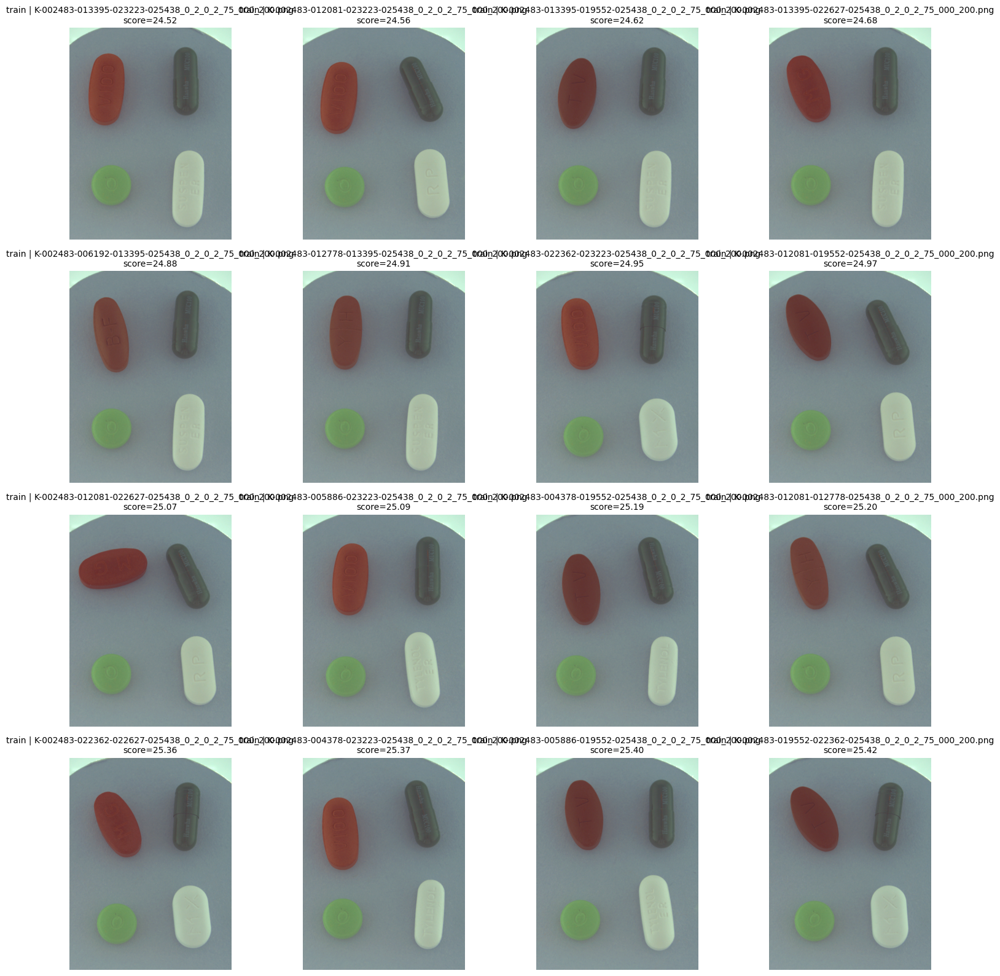

In [7]:
# 흐린 이미지 TOP K 시각화 (scores 미존재 시 자동 산출)
import os, math
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# 안전한 tqdm 대체
try:
    from tqdm import tqdm
except Exception:
    def tqdm(x, **kwargs):
        return x

# blur_score / 데이터 탐지 유틸이 없으면 정의
try:
    blur_score  # noqa
except NameError:
    import cv2
    def blur_score(path):
        try:
            img = cv2.imdecode(np.fromfile(path, dtype=np.uint8), cv2.IMREAD_GRAYSCALE)
            if img is None:
                return None
            lap = cv2.Laplacian(img, cv2.CV_64F)
            return float(lap.var())
        except Exception:
            return None

try:
    img_files  # noqa
except NameError:
    # yolo_root 탐지 후 img_files 구성
    from pathlib import Path
    def discover_yolo_root():
        try:
            if 'yolo_root' in globals() and yolo_root and os.path.isdir(yolo_root):
                return yolo_root
        except Exception:
            pass
        try:
            if 'yolo_root_found' in globals() and yolo_root_found and os.path.isdir(yolo_root_found):
                return yolo_root_found
        except Exception:
            pass
        for c in [Path('./data/data_yolo'), Path('./data_yolo')]:
            if (c / 'images' / 'train').is_dir():
                return str(c)
        for base in [Path('./data'), Path('.')]:
            if not base.exists():
                continue
            for root, dirs, files in os.walk(base):
                if 'data_yolo' in dirs:
                    yr = Path(root) / 'data_yolo'
                    if (yr / 'images' / 'train').is_dir():
                        return str(yr)
        return None
    yr = discover_yolo_root()
    if not yr:
        raise RuntimeError('data_yolo를 찾지 못했습니다. 먼저 YOLO 데이터 구성을 완료하세요.')
    img_train_dir = os.path.join(yr, 'images', 'train')
    img_val_dir   = os.path.join(yr, 'images', 'val')
    IMG_EXT = ('.png', '.jpg', '.jpeg')
    img_files = []
    for d in [img_train_dir, img_val_dir]:
        if os.path.isdir(d):
            for f in os.listdir(d):
                if f.lower().endswith(IMG_EXT):
                    img_files.append(os.path.join(d, f))

# scores 미존재 또는 비어있으면 재산출
try:
    scores  # noqa
    if not isinstance(scores, list) or len(scores) == 0:
        raise NameError
except Exception:
    tmp_scores = []
    for p in tqdm(img_files, desc='Re-scoring (blur)'):
        s = blur_score(p)
        if s is not None:
            tmp_scores.append((p, s))
    tmp_scores.sort(key=lambda x: x[1])
    scores = tmp_scores

# 시각화 파라미터
K = 16  # 보여줄 개수
cols = 4
rows = math.ceil(min(K, len(scores)) / cols) if scores else 1

print(f'시각화 대상 개수: {min(K, len(scores)) if scores else 0}')

if not scores:
    print('경고: 시각화할 스코어가 없습니다.')
else:
    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
    if rows == 1 and cols == 1:
        axes = np.array([[axes]])
    elif rows == 1:
        axes = np.array([axes])

    subset = scores[:min(K, len(scores))]
    for idx, (p, s) in enumerate(subset):
        r = idx // cols
        c = idx % cols
        ax = axes[r, c]
        try:
            img = Image.open(p).convert('RGB')
            ax.imshow(img)
        except Exception:
            ax.text(0.5, 0.5, '이미지 로드 실패', ha='center', va='center')
        base = os.path.basename(p)
        split = 'train' if (os.sep+'train'+os.sep) in p else ('val' if (os.sep+'val'+os.sep) in p else '')
        ax.set_title(f'{split} | {base}\nscore={s:.2f}', fontsize=10)
        ax.axis('off')

    # 빈 칸 처리
    total_axes = rows * cols
    for j in range(len(subset), total_axes):
        r = j // cols
        c = j % cols
        axes[r, c].axis('off')

    plt.tight_layout()
    plt.show()

## 흐린 이미지 라벨 개선


yolo_root: data\data_yolo
YAML loaded: data\data_yolo\yolo_data.yaml
클래스 수: 73
이미지 개수: train=1341, val=148, total=1489
기존 blur scores 재사용(정규화 적용)
선택된 K(흐림): 16


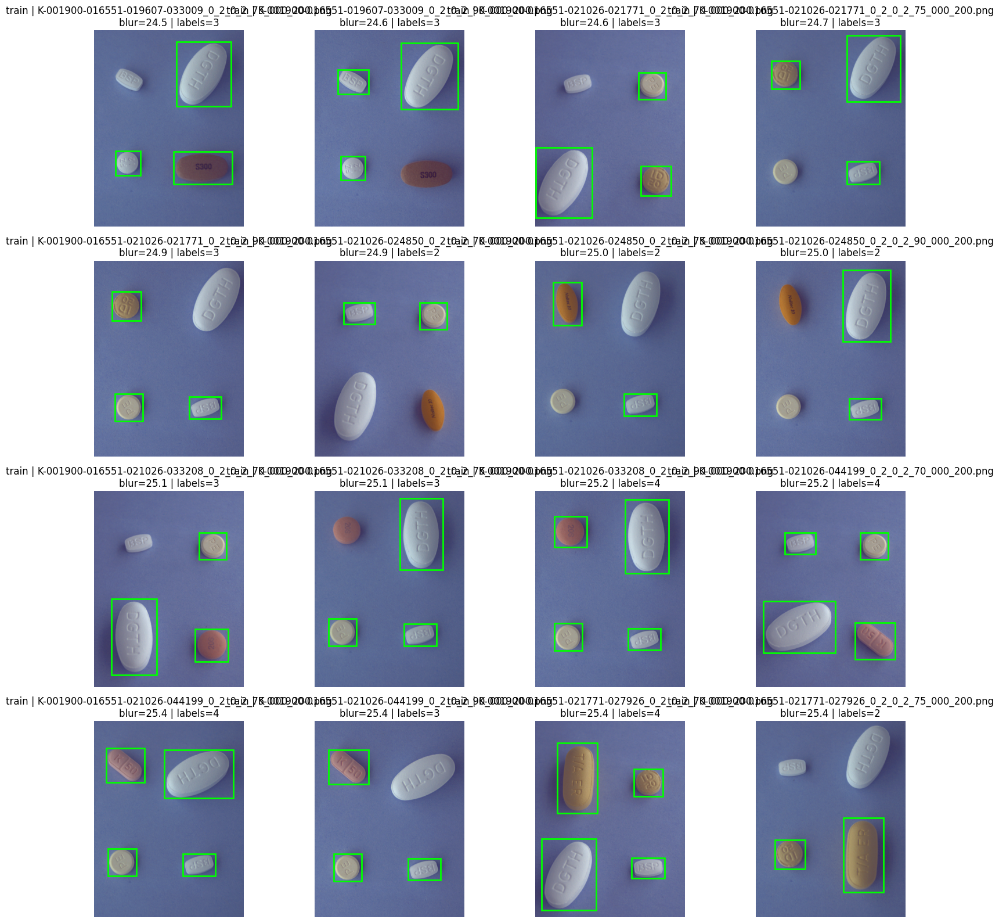

표시 이미지 수: 16, 네거티브 수: 0


In [14]:
# YOLO 라벨 오버레이: blur score 상위(가장 흐린) K개를 그리드로 시각화
import os, sys, math, glob, yaml, random
from pathlib import Path
from collections import defaultdict
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt

# 시드 고정
random.seed(42); np.random.seed(42)

# 1) yolo_root 자동 탐지
def autodiscover_yolo_root():
    # 우선 노트북 컨텍스트에서 발견된 변수 우선
    try:
        if 'yolo_root' in globals() and isinstance(yolo_root, str) and yolo_root and os.path.isdir(yolo_root):
            return yolo_root
    except Exception:
        pass
    # 자동 후보
    candidates = [
        os.path.join('data', 'data_yolo'),
        os.path.join('..', 'data', 'data_yolo'),
        'data_yolo',
        os.path.join('..', 'data_yolo'),
    ]
    for c in candidates:
        if os.path.isdir(c):
            return c
    # 실패 시 현재 디렉토리 반환(후속 경로에서 실패 처리)
    return '.'

yr = autodiscover_yolo_root()
print(f"yolo_root: {yr}")

# 2) YAML 로딩 및 클래스 이름 확보
def load_yaml_names(yolo_root_path):
    yml_candidates = [
        os.path.join(yolo_root_path, 'yolo_data.yaml'),
        os.path.join(yolo_root_path, 'data.yaml'),
        os.path.join(yolo_root_path, 'dataset.yaml'),
    ]
    data = None
    for yp in yml_candidates:
        if os.path.isfile(yp):
            with open(yp, 'r', encoding='utf-8') as f:
                data = yaml.safe_load(f)
            print(f"YAML loaded: {yp}")
            break
    if data is None:
        raise FileNotFoundError("yolo_data.yaml/data.yaml/dataset.yaml 중 하나를 찾을 수 없습니다.")
    names = data.get('names')
    if isinstance(names, dict):
        # id 키 순으로 정렬 후 리스트화
        names = [v for k, v in sorted(names.items(), key=lambda kv: int(k))]
    assert isinstance(names, (list, tuple)), "YAML의 names가 리스트/튜플 형식이어야 합니다."
    return list(names)

names = load_yaml_names(yr)
nc = len(names)
print(f"클래스 수: {nc}")

# 3) 이미지/라벨 경로 수집
img_train_dir = os.path.join(yr, 'images', 'train')
img_val_dir   = os.path.join(yr, 'images', 'val')
lbl_train_dir = os.path.join(yr, 'labels', 'train')
lbl_val_dir   = os.path.join(yr, 'labels', 'val')
IMG_EXT = ('.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff')

train_imgs = [p for p in glob.glob(os.path.join(img_train_dir, '**', '*'), recursive=True) if p.lower().endswith(IMG_EXT)]
val_imgs   = [p for p in glob.glob(os.path.join(img_val_dir, '**', '*'),   recursive=True) if p.lower().endswith(IMG_EXT)]
all_imgs   = train_imgs + val_imgs
print(f"이미지 개수: train={len(train_imgs)}, val={len(val_imgs)}, total={len(all_imgs)}")

# 4) blur scores가 이미 있으면 재사용, 없으면 간단 산출
def compute_blur_score(img_path):
    try:
        img = cv2.imdecode(np.fromfile(img_path, dtype=np.uint8), cv2.IMREAD_GRAYSCALE)  # Windows 경로 안전
        if img is None:
            return float('inf')  # 읽기 실패는 최상위로 보내지 않도록 큰 값
        return cv2.Laplacian(img, cv2.CV_64F).var()
    except Exception:
        return float('inf')

def score_value(x):
    # 다양한 형태(tuple/list/dict/number)의 score를 float로 정규화
    if isinstance(x, (int, float)) and not isinstance(x, bool):
        return float(x)
    if isinstance(x, (list, tuple)):
        for t in x:
            if isinstance(t, (int, float)) and not isinstance(t, bool):
                return float(t)
    if isinstance(x, dict):
        for k in ('score','blur','var','val','value'):
            v = x.get(k, None)
            if isinstance(v, (int, float)) and not isinstance(v, bool):
                return float(v)
    return float('inf')
try:
    scores  # noqa: F821
    # 정규화 및 길이 검사
    norm_scores = [score_value(s) for s in scores]
    if len(norm_scores) != len(all_imgs):
        raise AssertionError
    print("기존 blur scores 재사용(정규화 적용)")
except Exception:
    print("blur scores 미발견/불일치 → 계산 진행")
    norm_scores = []
    for p in all_imgs:
        norm_scores.append(compute_blur_score(p))

# 5) 상위 K개(가장 흐림) 선택
K = globals().get('K', 12)  # 기존 설정 사용 또는 기본 12
pairs = list(zip(all_imgs, norm_scores))
pairs_sorted = sorted(pairs, key=lambda x: (x[1], os.path.basename(x[0])))  # 점수 오름차순=흐림
topK = pairs_sorted[:min(K, len(pairs_sorted))]
print("선택된 K(흐림):", len(topK))

# 6) 라벨 로더(YOLO 형식)
def load_yolo_labels_for_image(img_path, yolo_root):
    # 이미지 경로에서 split과 상대경로 추정
    img_path = os.path.normpath(img_path)
    rel = None
    split = None
    for sp in ['train', 'val']:
        prefix = os.path.normpath(os.path.join(yolo_root, 'images', sp))
        try:
            common = os.path.commonpath([img_path, prefix])
        except Exception:
            common = ''
        if common == prefix:
            split = sp
            rel = os.path.relpath(img_path, prefix)
            break
    if rel is None or split is None:
        return []  # 외부 이미지
    lbl_dir = os.path.join(yolo_root, 'labels', split)
    stem = os.path.splitext(rel)[0]
    lbl_path = os.path.join(lbl_dir, stem + '.txt')
    if not os.path.isfile(lbl_path):
        return []
    boxes = []
    try:
        with open(lbl_path, 'r', encoding='utf-8') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) != 5:
                    continue
                cls = int(parts[0]); x, y, w, h = map(float, parts[1:])
                boxes.append((cls, x, y, w, h))
    except Exception:
        return []
    return boxes

# 7) 시각화
def draw_boxes(ax, img_bgr, boxes, names, show_label=False):
    h, w = img_bgr.shape[:2]
    for (cls, xc, yc, bw, bh) in boxes:
        # YOLO → 픽셀 좌표
        x = (xc - bw/2.0) * w
        y = (yc - bh/2.0) * h
        ww = bw * w
        hh = bh * h
        x1,y1,x2,y2 = max(0,int(x)), max(0,int(y)), min(w-1,int(x+ww)), min(h-1,int(y+hh))
        rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, color='lime', linewidth=2)
        ax.add_patch(rect)
        if show_label:
            label = names[cls] if 0 <= cls < len(names) else str(cls)
            ax.text(x1, max(0, y1-2), label, color='black', fontsize=8,
                    bbox=dict(facecolor='yellow', alpha=0.7, edgecolor='none', pad=1.0))

cols = 4
rows = math.ceil(len(topK) / cols) if len(topK) else 1
fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
axes = np.array(axes).reshape(rows, cols) if isinstance(axes, np.ndarray) else np.array([[axes]])

negatives = 0
for idx, (img_path, sc) in enumerate(topK):
    r = idx // cols; c = idx % cols
    ax = axes[r, c]
    # Windows 경로에서 한글/공백 대비 imdecode 사용
    img_bgr = cv2.imdecode(np.fromfile(img_path, dtype=np.uint8), cv2.IMREAD_COLOR)
    if img_bgr is None:
        ax.axis('off'); ax.set_title(f"로드 실패\n{os.path.basename(img_path)}")
        continue
    boxes = load_yolo_labels_for_image(img_path, yr)
    if len(boxes) == 0:
        negatives += 1
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    ax.imshow(img_rgb)
    draw_boxes(ax, img_bgr, boxes, names, show_label=False)  # 텍스트 숨김(옵션)
    sp = 'train' if os.path.normpath(img_path).find(os.path.normpath(os.path.join(yr,'images','train'))) != -1 else 'val' if os.path.normpath(img_path).find(os.path.normpath(os.path.join(yr,'images','val'))) != -1 else '?'
    sc_float = score_value(sc)
    ax.set_title(f"{sp} | {os.path.basename(img_path)}\nblur={sc_float:.1f} | labels={len(boxes)}")
    ax.axis('off')

# 빈 칸 숨김
total_axes = rows * cols
for t in range(len(topK), total_axes):
    r = t // cols; c = t % cols
    axes[r, c].axis('off')

plt.tight_layout()
plt.show()
print(f"표시 이미지 수: {len(topK)}, 네거티브 수: {negatives}")

## 선명도 향상(시각화)

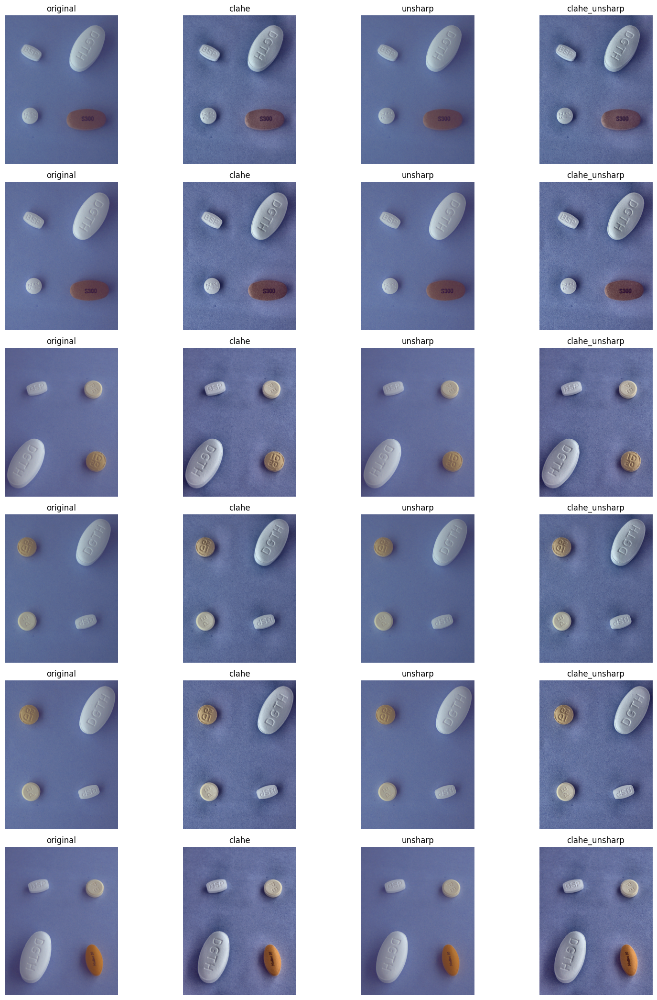

향상 비교 완료: 샘플 6장 × 모드 4개


In [13]:
# 선명도 향상: CLAHE, Unsharp, CLAHE→Unsharp 비교 시각화
import cv2, numpy as np, os, math, matplotlib.pyplot as plt

# 파라미터(필요시 조정)
CLAHE_CLIP = 2.0
CLAHE_TILE = (8, 8)
UNSHARP_AMOUNT = 1.2  # 강도(>1.0)
UNSHARP_RADIUS = 1.2  # 가우시안 블러 시그마
UNSHARP_THRESHOLD = 2  # 차이 임계(0~255)

def apply_clahe_rgb(img_bgr, clip=CLAHE_CLIP, tile=CLAHE_TILE):
    lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=clip, tileGridSize=tile)
    l2 = clahe.apply(l)
    lab2 = cv2.merge([l2, a, b])
    return cv2.cvtColor(lab2, cv2.COLOR_LAB2BGR)

def unsharp_mask_bgr(img_bgr, amount=UNSHARP_AMOUNT, radius=UNSHARP_RADIUS, threshold=UNSHARP_THRESHOLD):
    # 가우시안 블러
    blurred = cv2.GaussianBlur(img_bgr, (0,0), radius)
    # 차이
    diff = cv2.absdiff(img_bgr, blurred)
    # 임계 이하 차이는 0으로
    if threshold > 0:
        mask = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)
        _, mask_bin = cv2.threshold(mask, threshold, 255, cv2.THRESH_BINARY)
        mask_bin = cv2.cvtColor(mask_bin, cv2.COLOR_GRAY2BGR)
        sharp = cv2.addWeighted(img_bgr, 1 + amount, blurred, -amount, 0)
        out = np.where(mask_bin>0, sharp, img_bgr)
        out = out.astype(np.uint8)
    else:
        out = cv2.addWeighted(img_bgr, 1 + amount, blurred, -amount, 0)
    return out

def enhance_pipeline(img_bgr, mode='clahe'):
    if mode == 'clahe':
        return apply_clahe_rgb(img_bgr)
    elif mode == 'unsharp':
        return unsharp_mask_bgr(img_bgr)
    elif mode == 'clahe_unsharp':
        return unsharp_mask_bgr(apply_clahe_rgb(img_bgr))
    else:
        return img_bgr

# 대상: 방금 선택한 topK(가장 흐린 이미지) 중 앞에서부터 최대 6장만 샘플
samples = topK[:min(6, len(topK))] if 'topK' in globals() else []
modes = ['original', 'clahe', 'unsharp', 'clahe_unsharp']
cols = len(modes) if len(modes) else 1
rows = len(samples) if len(samples) else 1
fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 3.5*rows))
if rows == 1 and cols == 1:
    axes = np.array([[axes]])
elif rows == 1:
    axes = np.array([axes])
elif cols == 1:
    axes = np.array([[a] for a in axes])

for r, (img_path, sc) in enumerate(samples):
    img_bgr = cv2.imdecode(np.fromfile(img_path, dtype=np.uint8), cv2.IMREAD_COLOR)
    for c, mode in enumerate(modes):
        ax = axes[r, c]
        if mode == 'original':
            shown = img_bgr
        else:
            shown = enhance_pipeline(img_bgr, mode)
        img_rgb = cv2.cvtColor(shown, cv2.COLOR_BGR2RGB)
        ax.imshow(img_rgb)
        if c == 0:
            ax.set_ylabel(os.path.basename(img_path), fontsize=9)
        ax.set_title(mode)
        ax.axis('off')

plt.tight_layout()
plt.show()
print(f"향상 비교 완료: 샘플 {len(samples)}장 × 모드 {len(modes)}개")

In [16]:
# [sharpness-compare] Laplacian variance for original/clahe/unsharp/clahe_unsharp

import os, glob, math, random
import numpy as np
import cv2
import matplotlib.pyplot as plt

try:
    import pandas as pd
except Exception:
    pd = None

# ===== 파라미터 =====
random.seed(42); np.random.seed(42)
N = 8  # 비교할 이미지 수
CLAHE_CLIP = 2.0
CLAHE_TILE = (8, 8)
UNSHARP_AMOUNT = 1.2
UNSHARP_RADIUS = 1.2
UNSHARP_THRESHOLD = 2

# ===== 유틸 =====
def autodiscover_yolo_root():
    for c in [os.path.join('data','data_yolo'),
              os.path.join('..','data','data_yolo'),
              'data_yolo',
              os.path.join('..','data_yolo')]:
        if os.path.isdir(c):
            return c
    return '.'

def apply_clahe_rgb(img_bgr, clip=CLAHE_CLIP, tile=CLAHE_TILE):
    lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
    l,a,b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=clip, tileGridSize=tile)
    l2 = clahe.apply(l)
    lab2 = cv2.merge([l2,a,b])
    return cv2.cvtColor(lab2, cv2.COLOR_LAB2BGR)

def unsharp_mask_bgr(img_bgr, amount=UNSHARP_AMOUNT, radius=UNSHARP_RADIUS, threshold=UNSHARP_THRESHOLD):
    blurred = cv2.GaussianBlur(img_bgr, (0,0), radius)
    diff = cv2.absdiff(img_bgr, blurred)
    if threshold > 0:
        mask = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)
        _, mask_bin = cv2.threshold(mask, threshold, 255, cv2.THRESH_BINARY)
        mask_bin = cv2.cvtColor(mask_bin, cv2.COLOR_GRAY2BGR)
        sharp = cv2.addWeighted(img_bgr, 1 + amount, blurred, -amount, 0)
        out = np.where(mask_bin>0, sharp, img_bgr).astype(np.uint8)
    else:
        out = cv2.addWeighted(img_bgr, 1 + amount, blurred, -amount, 0)
    return out

def enhance_pipeline(img_bgr, mode='clahe_unsharp'):
    if mode == 'clahe':
        return apply_clahe_rgb(img_bgr)
    if mode == 'unsharp':
        return unsharp_mask_bgr(img_bgr)
    if mode == 'clahe_unsharp':
        return unsharp_mask_bgr(apply_clahe_rgb(img_bgr))
    return img_bgr

def sharpness_laplacian(img_bgr):
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    return float(cv2.Laplacian(gray, cv2.CV_64F).var())

# ===== 이미지 수집 =====
yr = autodiscover_yolo_root()
img_train_dir = os.path.join(yr, 'images', 'train')
img_val_dir   = os.path.join(yr, 'images', 'val')
IMG_EXT = ('.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff')

all_imgs = [p for p in glob.glob(os.path.join(img_train_dir, '**', '*'), recursive=True) if p.lower().endswith(IMG_EXT)]
all_imgs += [p for p in glob.glob(os.path.join(img_val_dir,   '**', '*'), recursive=True) if p.lower().endswith(IMG_EXT)]

if not all_imgs:
    print('[sharpness-compare] 비교할 이미지가 없습니다. yolo_root:', yr)
else:
    subset = all_imgs[:N] if len(all_imgs) >= N else all_imgs
    rows = []
    for ip in subset:
        img_bgr = cv2.imdecode(np.fromfile(ip, dtype=np.uint8), cv2.IMREAD_COLOR)
        if img_bgr is None:
            continue

        # 원본 및 각 변환
        s_orig   = sharpness_laplacian(img_bgr)
        s_clahe  = sharpness_laplacian(apply_clahe_rgb(img_bgr))
        s_unsharp= sharpness_laplacian(unsharp_mask_bgr(img_bgr))
        s_cu     = sharpness_laplacian(enhance_pipeline(img_bgr, 'clahe_unsharp'))

        def pct(delta, base):
            return (delta/base*100.0) if base > 0 else float('nan')

        rows.append({
            'image': os.path.basename(ip),
            'orig': s_orig,
            'clahe': s_clahe,
            'unsharp': s_unsharp,
            'clahe_unsharp': s_cu,
            'improve_clahe_%': pct(s_clahe - s_orig, s_orig),
            'improve_unsharp_%': pct(s_unsharp - s_orig, s_orig),
            'improve_cu_%': pct(s_cu - s_orig, s_orig),
        })

    if not rows:
        print('[sharpness-compare] 유효 이미지가 없습니다.')
    else:
        # 표/요약 출력
        if pd is not None:
            df = pd.DataFrame(rows)
            for col in ['orig','clahe','unsharp','clahe_unsharp','improve_clahe_%','improve_unsharp_%','improve_cu_%']:
                df[col] = df[col].astype(float).round(2)
            print(df.sort_values('improve_cu_%', ascending=False).to_string(index=False))

            avg_scores = df[['orig','clahe','unsharp','clahe_unsharp']].mean().round(2)
            avg_improve = df[['improve_clahe_%','improve_unsharp_%','improve_cu_%']].mean().round(2)
            print('\n평균 선명도:', avg_scores.to_dict())
            print('평균 개선율(%):', avg_improve.to_dict())
        else:
            for r in rows:
                print(f"{r['image']}: "
                      f"orig={r['orig']:.2f}, clahe={r['clahe']:.2f}, unsharp={r['unsharp']:.2f}, cu={r['clahe_unsharp']:.2f} | "
                      f"Δclahe={r['improve_clahe_%']:.1f}%, Δunsharp={r['improve_unsharp_%']:.1f}%, Δcu={r['improve_cu_%']:.1f}%")
            o  = np.mean([r['orig'] for r in rows])
            c  = np.mean([r['clahe'] for r in rows])
            u  = np.mean([r['unsharp'] for r in rows])
            cu = np.mean([r['clahe_unsharp'] for r in rows])
            print(f"\n평균 선명도: orig={o:.2f}, clahe={c:.2f}, unsharp={u:.2f}, cu={cu:.2f}")
            def avg_imp(key):
                xs = [r[key] for r in rows if not math.isnan(r[key])]
                return float(np.mean(xs)) if xs else float('nan')
            print(f"평균 개선율(%%): clahe={avg_imp('improve_clahe_%'):.1f}, unsharp={avg_imp('improve_unsharp_%'):.1f}, cu={avg_imp('improve_cu_%'):.1f}")

                                               image  orig  clahe  unsharp  clahe_unsharp  improve_clahe_%  improve_unsharp_%  improve_cu_%
K-001900-016551-021026-021771_0_2_0_2_70_000_200.png 38.04 316.33   127.75        1434.52           731.50             235.81       3670.76
K-001900-016551-021026-021771_0_2_0_2_75_000_200.png 36.91 301.79   112.23        1371.98           717.56             204.02       3616.77
K-001900-016551-021026-021771_0_2_0_2_90_000_200.png 47.39 385.96   173.51        1753.93           714.49             266.16       3601.31
K-001900-016551-021026-024850_0_2_0_2_70_000_200.png 38.87 314.13   129.94        1424.68           708.23             234.33       3565.57
K-001900-016551-021026-024850_0_2_0_2_75_000_200.png 37.31 298.30   112.69        1353.50           699.44             202.01       3527.36
K-001900-016551-021026-024850_0_2_0_2_90_000_200.png 47.18 375.82   172.11        1707.35           696.58             264.81       3518.83
K-001900-016551-0196